# Primeiro contato com os datasets

## Importando bibliotecas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np

from ydata_profiling import ProfileReport
import tqdm as notebook_tqdm

from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

/home/matsa/miniconda3/envs/project03/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Dataset application_train

O dataset de train possui a variável **TARGET**<br>

A variável TARGET pode ser **1 ou 0**
- **1**: representa cliente com alguma dificuldade em realizar pagamentos das parcelas do seu empréstimo(pagamento atrasado)
- **0**: cliente que não teve atrasos

Uma linha, tanto nos datasets de treino e teste **representam um empréstimo**

In [2]:
app_train_df = pd.read_csv('./datasets/application_train.csv')
app_train_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
pd.options.display.max_rows = 1000

In [4]:
app_train_df.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [5]:
app_train_df.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

In [6]:
((app_train_df.isnull().sum() / len(app_train_df)) * 100).sort_values()

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
NAME_FAMILY_STATUS               0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_INCOME_TYPE                 0.000000
NAME_HOUSING_TYPE                0.000000
DAYS_EMPLOYED                    0.000000
DAYS_BIRTH                       0.000000
REGION_POPULATION_RELATIVE       0.000000
REGION_RATING_CLIENT_W_CITY      0.000000
FLAG_CONT_MOBILE                 0.000000
FLAG_PHONE                       0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0.000000
FLAG_WORK_PHONE                  0

Observar variáveis com quantidades muito grandes de valores nulos

In [7]:
app_train_df.duplicated().sum()

np.int64(0)

A proporção de pessoas com atraso de pagamento é pequena

In [8]:
(app_train_df['TARGET'].value_counts(normalize=True)*100).round(2)

TARGET
0    91.93
1     8.07
Name: proportion, dtype: float64

## Dataset application_test

Sem a variável TARGET

In [9]:
app_test_df = pd.read_csv('./datasets/application_test.csv')
app_test_df

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


## Dataset bureau

Créditos anteriores de um cliente(**SK_ID_CURR** -> id do empréstimo) fornecidos por um **birô de crédito**.
Um empréstimo pode ter vários créditos anteriores em agências de crédito

**SK_BUREAU_ID** -> id de créditos anteriores relacionados ao empréstimo (único para cada empréstimo)

Um birô de crédito é uma entidade que coleta, analisa e fornece informações financeiras valiosas das pessoas para uma tomada de decisão eficaz.

In [10]:
bureau_df = pd.read_csv('./datasets/bureau.csv')
bureau_df

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


In [11]:
bureau_df['SK_ID_CURR'].duplicated().sum()

np.int64(1410617)

In [12]:
bureau_df['SK_ID_BUREAU'].duplicated().sum()

np.int64(0)

In [13]:
bureau_df.dtypes

SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int64
CREDIT_DAY_OVERDUE          int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG          int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int64
AMT_ANNUITY               float64
dtype: object

In [14]:
bureau_df['CREDIT_TYPE'].value_counts()

CREDIT_TYPE
Consumer credit                                 1251615
Credit card                                      402195
Car loan                                          27690
Mortgage                                          18391
Microloan                                         12413
Loan for business development                      1975
Another type of loan                               1017
Unknown type of loan                                555
Loan for working capital replenishment              469
Cash loan (non-earmarked)                            56
Real estate loan                                     27
Loan for the purchase of equipment                   19
Loan for purchase of shares (margin lending)          4
Mobile operator loan                                  1
Interbank credit                                      1
Name: count, dtype: int64

In [15]:
(bureau_df['CREDIT_TYPE'].value_counts(normalize=True)*100).round(2)

CREDIT_TYPE
Consumer credit                                 72.92
Credit card                                     23.43
Car loan                                         1.61
Mortgage                                         1.07
Microloan                                        0.72
Loan for business development                    0.12
Another type of loan                             0.06
Unknown type of loan                             0.03
Loan for working capital replenishment           0.03
Cash loan (non-earmarked)                        0.00
Real estate loan                                 0.00
Loan for the purchase of equipment               0.00
Loan for purchase of shares (margin lending)     0.00
Mobile operator loan                             0.00
Interbank credit                                 0.00
Name: proportion, dtype: float64

Provavelmente **CREDIT_TYPE** será uma variável que teremos que realizar alguns tratamentos

In [16]:
bureau_df.isnull().sum()

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

Porcentagem de valores nulos de acordo com o tamanho do dataset

In [17]:
(bureau_df.isnull().sum() / len(bureau_df)) *100

SK_ID_CURR                 0.000000
SK_ID_BUREAU               0.000000
CREDIT_ACTIVE              0.000000
CREDIT_CURRENCY            0.000000
DAYS_CREDIT                0.000000
CREDIT_DAY_OVERDUE         0.000000
DAYS_CREDIT_ENDDATE        6.149573
DAYS_ENDDATE_FACT         36.916958
AMT_CREDIT_MAX_OVERDUE    65.513264
CNT_CREDIT_PROLONG         0.000000
AMT_CREDIT_SUM             0.000757
AMT_CREDIT_SUM_DEBT       15.011932
AMT_CREDIT_SUM_LIMIT      34.477415
AMT_CREDIT_SUM_OVERDUE     0.000000
CREDIT_TYPE                0.000000
DAYS_CREDIT_UPDATE         0.000000
AMT_ANNUITY               71.473490
dtype: float64

Variáveis com quantidades muito grandes de valores nulos

In [18]:
bureau_df.duplicated().sum()

np.int64(0)

## Dataset bureau_balance

O **SK_ID_BUREAU** é o ID de cada crédito anterior que um cliente teve e que foi reportado ao birô<br>
**MONTHS_BALANCE** é o tempo relativo à data da aplicação do empréstimo. Histórico do saldo de um crédito anterior a cada mês. (-1 registro mais recente antes da nova solicitação de crédito)

In [19]:
bureau_bal_df = pd.read_csv('./datasets/bureau_balance.csv')
bureau_bal_df

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


In [20]:
bureau_bal_df['STATUS'].value_counts()

STATUS
C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: count, dtype: int64

In [21]:
(bureau_bal_df['STATUS'].value_counts(normalize=True)*100).round(2)

STATUS
C    49.99
0    27.47
X    21.28
1     0.89
5     0.23
2     0.09
3     0.03
4     0.02
Name: proportion, dtype: float64

In [22]:
bureau_bal_df.isnull().sum()

SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [23]:
bureau_bal_df.duplicated().sum()

np.int64(0)

## Dataset previous_application

Aplicações anteriores para empréstimos Home Credit de clientes que têm empréstimos

In [24]:
prev_app_df = pd.read_csv('./datasets/previous_application.csv')
prev_app_df

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


In [25]:
prev_app_df.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

Algumas variáveis com **muitos registros nulos**

In [26]:
prev_app_df.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [27]:
(prev_app_df.isnull().sum() / len(prev_app_df)) *100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [28]:
prev_app_df.duplicated().sum()

np.int64(0)

## Dataset POS_CASH_balance

Balanço mensal dos empréstimos anteriores de clientes na Home Credit

In [29]:
pos_cash_bal_df = pd.read_csv('./datasets/POS_CASH_balance.csv')
pos_cash_bal_df

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


In [30]:
pos_cash_bal_df.dtypes

SK_ID_PREV                 int64
SK_ID_CURR                 int64
MONTHS_BALANCE             int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS      object
SK_DPD                     int64
SK_DPD_DEF                 int64
dtype: object

In [31]:
pos_cash_bal_df.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64

In [32]:
pos_cash_bal_df.duplicated().sum()

np.int64(0)

## Dataset credit_card_balance

Saldos mensais de cartões de crédito anteriores que o requerente tem com a Home Credit

In [33]:
credit_card_bal = pd.read_csv('./datasets/credit_card_balance.csv')
credit_card_bal

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,...,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,...,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,...,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


In [34]:
credit_card_bal.dtypes

SK_ID_PREV                      int64
SK_ID_CURR                      int64
MONTHS_BALANCE                  int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL         int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT            int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS           object
SK_DPD                          int64
SK_DPD_DEF                      int64
dtype: object

In [35]:
credit_card_bal.isnull().sum()

SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
dtype: int64

In [36]:
credit_card_bal.duplicated().sum()

np.int64(0)

## Dataset installments_payments

Histórico de pagamentos para os créditos previamente liberados pela Home Credit

In [37]:
install_pay_df = pd.read_csv('./datasets/installments_payments.csv')
install_pay_df

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


In [38]:
install_pay_df.dtypes

SK_ID_PREV                  int64
SK_ID_CURR                  int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER       int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64
dtype: object

In [39]:
install_pay_df.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
dtype: int64

In [40]:
install_pay_df.duplicated().sum()

np.int64(0)

## Otimização dos datasets

Aplicação de uma função para redução do uso de memória RAM através da conversão de tipos int64 e float64

In [41]:
def reduce_mem_usage(df, verbose=True):
    start_mem = df.memory_usage().sum() / 1024**2
    
    for col in df.columns:
        col_type = df[col].dtypes
        
        if col_type == 'int64': 
            c_min, c_max = df[col].min(), df[col].max()
            if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                df[col] = df[col].astype(np.int8)
            elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                df[col] = df[col].astype(np.int16)
            elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                df[col] = df[col].astype(np.int32)
        
        elif col_type == 'float64': 
            df[col] = df[col].astype(np.float32)

    end_mem = df.memory_usage().sum() / 1024**2
    if verbose:
        print(f'Memory usage after optimization: {end_mem:.2f} MB')
        print(f'Decreased by {100 * (start_mem - end_mem) / start_mem:.1f}%')

    return df

### Dataset application_train

In [42]:
app_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [43]:
app_train_df = reduce_mem_usage(app_train_df)

Memory usage after optimization: 128.16 MB
Decreased by 55.2%


In [44]:
app_train_df.dtypes

SK_ID_CURR                        int32
TARGET                             int8
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                       int8
AMT_INCOME_TOTAL                float32
AMT_CREDIT                      float32
AMT_ANNUITY                     float32
AMT_GOODS_PRICE                 float32
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float32
DAYS_BIRTH                        int16
DAYS_EMPLOYED                     int32
DAYS_REGISTRATION               float32
DAYS_ID_PUBLISH                   int16
OWN_CAR_AGE                     float32
FLAG_MOBIL                         int8
FLAG_EMP_PHONE                     int8
FLAG_WORK_PHONE                    int8


### Dataset application_test

In [45]:
app_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB


In [46]:
app_test_df = reduce_mem_usage(app_test_df)

Memory usage after optimization: 20.27 MB
Decreased by 55.0%


In [47]:
app_test_df.dtypes

SK_ID_CURR                        int32
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                       int8
AMT_INCOME_TOTAL                float32
AMT_CREDIT                      float32
AMT_ANNUITY                     float32
AMT_GOODS_PRICE                 float32
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float32
DAYS_BIRTH                        int16
DAYS_EMPLOYED                     int32
DAYS_REGISTRATION               float32
DAYS_ID_PUBLISH                   int16
OWN_CAR_AGE                     float32
FLAG_MOBIL                         int8
FLAG_EMP_PHONE                     int8
FLAG_WORK_PHONE                    int8
FLAG_CONT_MOBILE                   int8


### Dataset bureau

In [48]:
bureau_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [49]:
bureau_df = reduce_mem_usage(bureau_df)

Memory usage after optimization: 119.49 MB
Decreased by 46.3%


In [50]:
bureau_df.dtypes

SK_ID_CURR                  int32
SK_ID_BUREAU                int32
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int16
CREDIT_DAY_OVERDUE          int16
DAYS_CREDIT_ENDDATE       float32
DAYS_ENDDATE_FACT         float32
AMT_CREDIT_MAX_OVERDUE    float32
CNT_CREDIT_PROLONG           int8
AMT_CREDIT_SUM            float32
AMT_CREDIT_SUM_DEBT       float32
AMT_CREDIT_SUM_LIMIT      float32
AMT_CREDIT_SUM_OVERDUE    float32
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int32
AMT_ANNUITY               float32
dtype: object

### Dataset bureau_balance

In [51]:
bureau_bal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [52]:
bureau_bal_df = reduce_mem_usage(bureau_bal_df)

Memory usage after optimization: 338.46 MB
Decreased by 45.8%


In [53]:
bureau_bal_df.dtypes

SK_ID_BUREAU       int32
MONTHS_BALANCE      int8
STATUS            object
dtype: object

### Dataset previous_application

In [54]:
prev_app_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [55]:
prev_app_df = reduce_mem_usage(prev_app_df)

Memory usage after optimization: 324.94 MB
Decreased by 31.1%


In [56]:
prev_app_df.dtypes

SK_ID_PREV                       int32
SK_ID_CURR                       int32
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float32
AMT_APPLICATION                float32
AMT_CREDIT                     float32
AMT_DOWN_PAYMENT               float32
AMT_GOODS_PRICE                float32
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START           int8
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY            int8
RATE_DOWN_PAYMENT              float32
RATE_INTEREST_PRIMARY          float32
RATE_INTEREST_PRIVILEGED       float32
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int16
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

### Dataset POS_CASH_balance

In [57]:
pos_cash_bal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [58]:
pos_cash_bal_df = reduce_mem_usage(pos_cash_bal_df)

Memory usage after optimization: 276.60 MB
Decreased by 54.7%


In [59]:
pos_cash_bal_df.dtypes

SK_ID_PREV                 int32
SK_ID_CURR                 int32
MONTHS_BALANCE              int8
CNT_INSTALMENT           float32
CNT_INSTALMENT_FUTURE    float32
NAME_CONTRACT_STATUS      object
SK_DPD                     int16
SK_DPD_DEF                 int16
dtype: object

### Dataset credit_card_balance

In [60]:
credit_card_bal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

In [61]:
credit_card_bal = reduce_mem_usage(credit_card_bal)

Memory usage after optimization: 318.63 MB
Decreased by 52.7%


In [62]:
credit_card_bal.dtypes

SK_ID_PREV                      int32
SK_ID_CURR                      int32
MONTHS_BALANCE                   int8
AMT_BALANCE                   float32
AMT_CREDIT_LIMIT_ACTUAL         int32
AMT_DRAWINGS_ATM_CURRENT      float32
AMT_DRAWINGS_CURRENT          float32
AMT_DRAWINGS_OTHER_CURRENT    float32
AMT_DRAWINGS_POS_CURRENT      float32
AMT_INST_MIN_REGULARITY       float32
AMT_PAYMENT_CURRENT           float32
AMT_PAYMENT_TOTAL_CURRENT     float32
AMT_RECEIVABLE_PRINCIPAL      float32
AMT_RECIVABLE                 float32
AMT_TOTAL_RECEIVABLE          float32
CNT_DRAWINGS_ATM_CURRENT      float32
CNT_DRAWINGS_CURRENT            int16
CNT_DRAWINGS_OTHER_CURRENT    float32
CNT_DRAWINGS_POS_CURRENT      float32
CNT_INSTALMENT_MATURE_CUM     float32
NAME_CONTRACT_STATUS           object
SK_DPD                          int16
SK_DPD_DEF                      int16
dtype: object

### Dataset installments_payments

In [63]:
install_pay_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [64]:
install_pay_df = reduce_mem_usage(install_pay_df)

Memory usage after optimization: 389.25 MB
Decreased by 53.1%


In [65]:
install_pay_df.dtypes

SK_ID_PREV                  int32
SK_ID_CURR                  int32
NUM_INSTALMENT_VERSION    float32
NUM_INSTALMENT_NUMBER       int16
DAYS_INSTALMENT           float32
DAYS_ENTRY_PAYMENT        float32
AMT_INSTALMENT            float32
AMT_PAYMENT               float32
dtype: object

# Análise exploratória dos dados

## Dataset application_train

### Análise de missing values

In [66]:
def plot_missing_values(df, rotation=90):
    """
    Plota um gráfico de linha que evidencia a porcentagem de valores faltantes de cada variável
    
    Args:
        df (DataFrame): DataFrame que contém os dados.

    Return:
        missing_values_percent: Variáveis com valores nulos
        
    Observação:
        Variáveis sem dados faltantes não são utilizadas no gráfico
    """
    
    missing_values_percent = (df.isnull().sum() / len(df)) *100
    missing_values_percent = missing_values_percent[missing_values_percent > 0.0].sort_values(ascending=True) #removendo variáveis sem valores faltantes

    plt.figure(figsize=(18, 6))
    sns.lineplot(x=missing_values_percent.index, y=missing_values_percent.values, marker='o', color="red")
    
    plt.xticks(rotation=rotation) 
    plt.ylabel("Porcentagem de Valores Nulos (%)", fontsize=12)
    plt.xlabel("Variáveis", fontsize=12)
    plt.title("Porcentagem de Valores Nulos por Variável", fontsize=14)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.show()

    return missing_values_percent

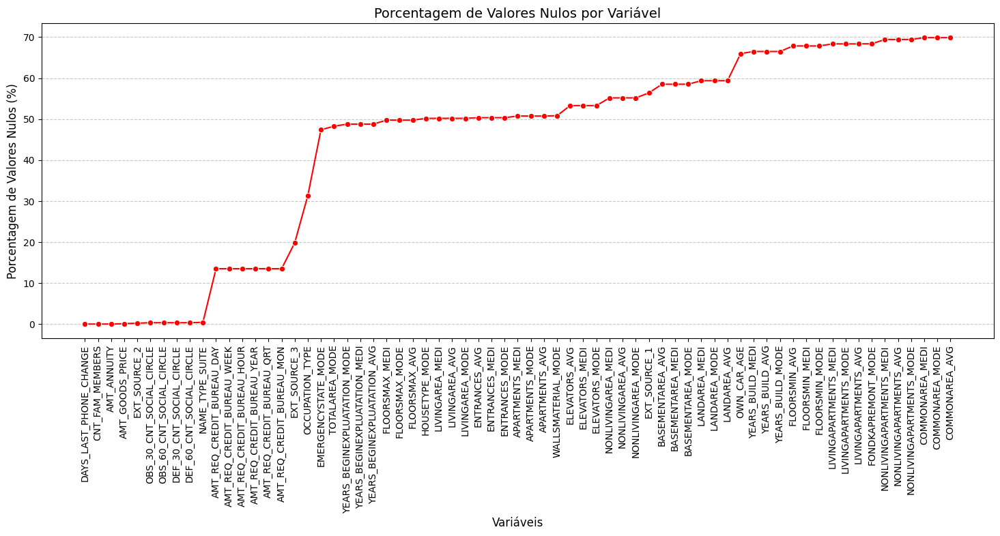

In [67]:
missing_values_app_train = plot_missing_values(app_train_df)

In [68]:
missing_values_app_train

DAYS_LAST_PHONE_CHANGE           0.000325
CNT_FAM_MEMBERS                  0.000650
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
EXT_SOURCE_2                     0.214626
OBS_30_CNT_SOCIAL_CIRCLE         0.332021
OBS_60_CNT_SOCIAL_CIRCLE         0.332021
DEF_30_CNT_SOCIAL_CIRCLE         0.332021
DEF_60_CNT_SOCIAL_CIRCLE         0.332021
NAME_TYPE_SUITE                  0.420148
AMT_REQ_CREDIT_BUREAU_DAY       13.501631
AMT_REQ_CREDIT_BUREAU_WEEK      13.501631
AMT_REQ_CREDIT_BUREAU_HOUR      13.501631
AMT_REQ_CREDIT_BUREAU_YEAR      13.501631
AMT_REQ_CREDIT_BUREAU_QRT       13.501631
AMT_REQ_CREDIT_BUREAU_MON       13.501631
EXT_SOURCE_3                    19.825307
OCCUPATION_TYPE                 31.345545
EMERGENCYSTATE_MODE             47.398304
TOTALAREA_MODE                  48.268517
YEARS_BEGINEXPLUATATION_MODE    48.781019
YEARS_BEGINEXPLUATATION_MEDI    48.781019
YEARS_BEGINEXPLUATATION_AVG     48.781019
FLOORSMAX_MEDI                  49

Analisando o gráfico é possível observar um padrão. As variáveis que estão "normalizadas" (de acordo com o documento de descrições) sobre o local onde o cliente vive, ou seja, aquelas variáveis que possuem sufixos de **_AVG, _MODE, _MEDI**, são as que possuem mais valores nulos.

É interessante realizar alguns questionamentos:<br>

**Informações sobre o local onde o cliente vive podem realmente impactar na análise de risco de crédito?** <br>
Bom, pode sim existir uma relação sobre os aspectos do local onde o cliente está vivendo com sua capacidade de pagamento.

**Imputar informações à esses tipos de variáveis, pela quantidade de valores nulos, seria uma boa medida?** <br>
Essa pergunta pode ser respondida


Variáveis como **OWN_CAR_AGE**, **OCCUPATION_TYPE** possuem muitos valores faltantes pois não são todos os clientes que possuem um carro próprio.

### Análise da variável TARGET

In [69]:
def visualize_histplot(df, feature, stat='count'):
    """
    Plota um histograma para uma variável numérica.
    
    Args:
        df (DataFrame): DataFrame que contém os dados.
        feature (str): Nome da variável a ser visualizada.
        stat (str): Estatística do histograma ('count', 'density', etc.).
    """
    plt.figure(figsize=(8, 5))
    sns.histplot(df[feature], bins=20, stat=stat, kde=False)
    plt.title(f"Distribuição da variável {feature}", fontsize=14)
    plt.xlabel(f"Variável {feature}")
    plt.ylabel("Registros")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


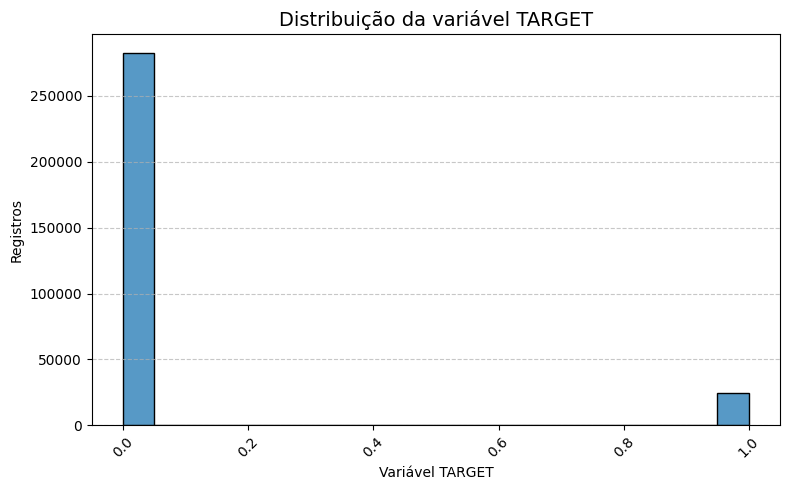

In [70]:
visualize_histplot(app_train_df, 'TARGET')

O gráfico acima da distribuição dos valores da variável **TARGET** evidencia que os dados para esta variável estão **DESBALANCEADOS**.
- Isso pois a proporção de clientes que não possuíram atrasos no pagamento(0) é muito maior do que os que tiveram algum atraso(1).
- Essa proporção não deve representar a realidade. Portanto, com a utilização das variáveis certas, com tratamentos adequados, essa distribuição deve mudar.

### Análise da distribuição de variáveis categóricas

In [71]:
categorical_vars = app_train_df.select_dtypes(exclude='number').columns
categorical_vars

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

In [72]:
def subplots_cat_vars(df):
    categorical_vars = df.select_dtypes(exclude='number').columns
    num_vars = len(categorical_vars)

    num_cols_subplot = 4  # Número fixo de colunas
    num_rows = int(np.ceil(num_vars / num_cols_subplot))  # Definir o número de linhas dinamicamente
    
    fig, axes = plt.subplots(num_rows, num_cols_subplot, figsize=(5 * num_cols_subplot, 4 * num_rows))  
    
    # Transformar em array 1D para facilitar indexação
    axes = axes.flatten()  

    for i, var in enumerate(categorical_vars):
        df[var].value_counts().plot(kind="bar", ax=axes[i], edgecolor='black')
        axes[i].set_title(f'Distribuição {var}')
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].set_ylabel('Frequência')
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)

        # Ocultar subplots vazios
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

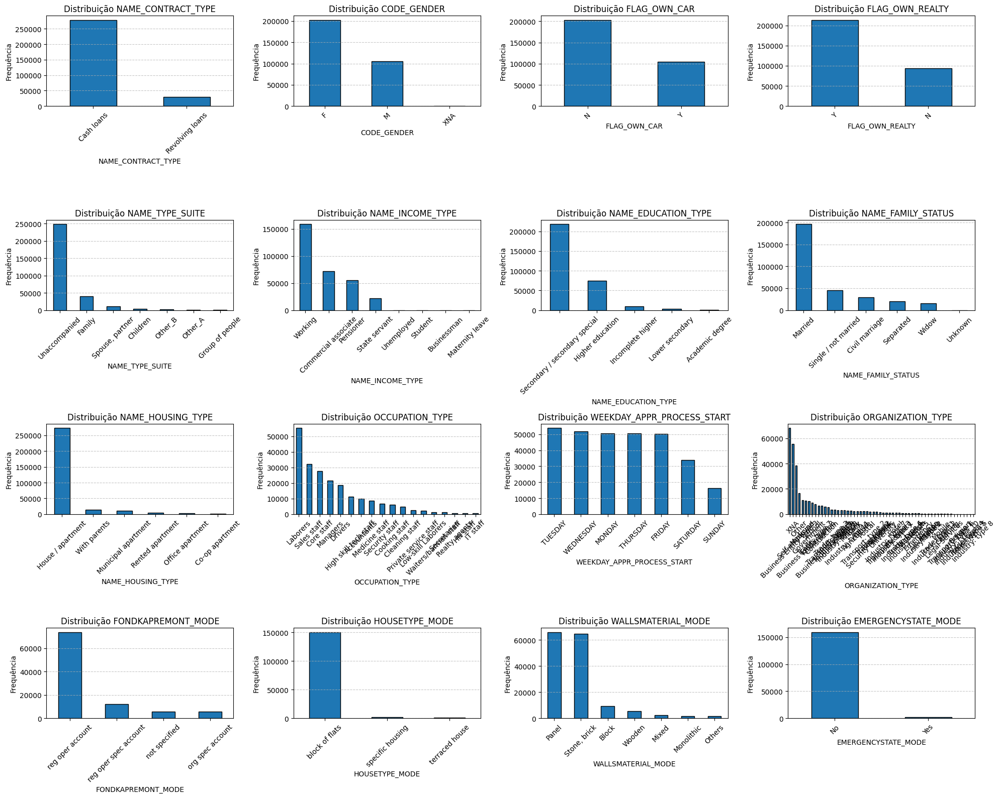

In [73]:
subplots_cat_vars(app_train_df)

Além disso, variáveis como **ORGANIZATION_TYPE**, **OCCUPATION_TYPE**, **NAME_EDUCATION_TYPE**, **NAME_FAMILY_STATUS** e **NAME_INCOME_TYPE** podem ser manipuladas para redução da quantidade de categorias (redução de dimensionalidade).

Também é possível refletir que variáveis como **CODE_GENDER**, **NAME_TYPE_SUITE** e **WEEKDAY_APPR_PROCESS_START** não fazem sentido de manter **por não contribuírem** em uma análise de risco de inadimplência.

Além disso, algumas variáveis relacionadas à construção que o cliente vive também podem não fazer sentido para a análise, como: **HOUSETYPE_MODE**, **WALLSMATERIAL_MODE**, **FONDKAPREMONT_MODE**, **EMERGENCYSTATE_MODE** e **NAME_HOUSING_TYPE**. Isso se deve pela suas distribuições serem muito desbalanceadas ou por não passarem informações muito relevantes.

### Manipulando variáveis categóricas

Removendo variáveis que não contribuem para a análise do risco de inadimplência

In [74]:
app_train_df_handled = app_train_df.copy()

In [75]:
app_train_df_handled = app_train_df_handled.drop(columns=['CODE_GENDER', 'NAME_TYPE_SUITE', 'WEEKDAY_APPR_PROCESS_START', 
                                                          'HOUSETYPE_MODE', 'FONDKAPREMONT_MODE', 'WALLSMATERIAL_MODE', 
                                                          'EMERGENCYSTATE_MODE', 'NAME_HOUSING_TYPE'])

In [76]:
print("Variáveis categóricas: ", app_train_df_handled.select_dtypes(exclude='number').columns)

Variáveis categóricas:  Index(['NAME_CONTRACT_TYPE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'OCCUPATION_TYPE', 'ORGANIZATION_TYPE'],
      dtype='object')


Manipulando as variáveis:
- ORGANIZATION_TYPE
- OCCUPATION_TYPE

In [77]:
app_train_df_handled['ORGANIZATION_TYPE'].value_counts().sort_index()

ORGANIZATION_TYPE
Advertising                 429
Agriculture                2454
Bank                       2507
Business Entity Type 1     5984
Business Entity Type 2    10553
Business Entity Type 3    67992
Cleaning                    260
Construction               6721
Culture                     379
Electricity                 950
Emergency                   560
Government                10404
Hotel                       966
Housing                    2958
Industry: type 1           1039
Industry: type 10           109
Industry: type 11          2704
Industry: type 12           369
Industry: type 13            67
Industry: type 2            458
Industry: type 3           3278
Industry: type 4            877
Industry: type 5            599
Industry: type 6            112
Industry: type 7           1307
Industry: type 8             24
Industry: type 9           3368
Insurance                   597
Kindergarten               6880
Legal Services              305
Medicine              

As categorias da variável **ORGANIZATION_TYPE** podem ser reagrupadas da seguinte forma:

- Industry 
- Transport
- Trade
- Business
- Public Sector
- Finance
- Service Industry
- Self-employed
- Unknown
- Other

Cada categoria foi agrupada em uma categoria mais abrangente, de forma que sua dimensionalidade seja reduzida, sendo importante se ela for utilizada para o treinamento do modelo.

In [78]:
def categorizing_organization_type(organization):
    if 'Industry' in organization:
        return 'Industry'
    elif 'Transport' in organization:
        return 'Transport'
    elif 'Trade' in organization:
        return 'Trade'
    elif 'Business' in organization:
        return 'Business Entity'
    elif any(gov in organization for gov in ['Government', 'Police', 'Military', 'Security Ministries']):
        return 'Public Sector'
    elif any(med in organization for med in ['Medicine', 'Hospital']):
        return 'Healthcare'
    elif any(edu in organization for edu in ['School', 'University', 'Kindergarten']):
        return 'Education'
    elif any(fin in organization for fin in ['Bank', 'Insurance']):
        return 'Finance'
    elif 'Self' in organization:
        return 'Self-employed'
    elif any(serv in organization for serv in ['Services', 'Restaurant', 'Hotel', 'Cleaning', 'Telecom', 'Electricity', 'Mobile']):
        return 'Service Industry'
    elif 'XNA' in organization:
        return 'Unknown'
    else:
        return 'Other'

In [79]:
app_train_df_handled['ORGANIZATION_CATEGORY'] = app_train_df_handled['ORGANIZATION_TYPE'].apply(categorizing_organization_type)

In [80]:
app_train_df_handled['ORGANIZATION_CATEGORY'].value_counts()

ORGANIZATION_CATEGORY
Business Entity     84529
Unknown             55374
Self-employed       38412
Other               36069
Public Sector       17353
Education           17100
Trade               14315
Industry            14311
Healthcare          11193
Transport            8990
Service Industry     6761
Finance              3104
Name: count, dtype: int64

In [81]:
app_train_df_handled = app_train_df_handled.drop(columns='ORGANIZATION_TYPE', axis=1) #removendo a coluna original

As categorias da variáveis **OCCUPATION_TYPE** podem ser reagrupadas da seguinte forma:


- Laborers:	Laborers, Low-skill Laborers, Cleaning staff, Cooking staff, Waiters/barmen staff
- Customer Service:	Sales staff, Realty agents, Private service staff
- Core Staff:	Core staff, Secretaries, HR staff
- Technical Service:	High skill tech staff, Accountants, IT staff, Medicine staff
- Managers:	Managers
- Security Service: Security staff
- Transport Service: Drivers

In [82]:
app_train_df_handled['OCCUPATION_TYPE'].value_counts()

OCCUPATION_TYPE
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: count, dtype: int64

In [83]:
def categorizing_occupation_type(occupation):

    if pd.isna(occupation):
        return '' # substituindo valores nulos por enquanto(é possível filtrá-los posteriormente)
    
    if any(labor in occupation for labor in ['Laborers', 'Low-skill Laborers', 'Cleaning staff', 'Cooking staff', 'Waiters/barmen staff']):
        return 'Laborer'
    elif any(job in occupation for job in ['Sales staff', 'Realty agents', 'Private service staff']):
        return 'Customer Service'
    elif any(core in occupation for core in ['Core staff', 'Secretaries', 'HR staff']):
        return 'Core Staff'
    elif any(tech in occupation for tech in ['High skill tech staff', 'Accountants', 'IT staff', 'Medicine staff']):
        return 'Technical Service'
    elif occupation == 'Managers':
        return 'Manager'
    elif occupation == 'Security Staff':
        return 'Security Service'
    elif occupation == 'Drivers':
        return 'Transport Service'

app_train_df_handled['OCCUPATION_CATEGORY'] = app_train_df_handled['OCCUPATION_TYPE'].apply(categorizing_occupation_type)

In [84]:
app_train_df_handled['OCCUPATION_CATEGORY'].value_counts()

OCCUPATION_CATEGORY
                     96391
Laborer              69226
Customer Service     35505
Technical Service    30256
Core Staff           29438
Manager              21371
Transport Service    18603
Name: count, dtype: int64

In [85]:
app_train_df_handled = app_train_df_handled.drop(columns='OCCUPATION_TYPE', axis=1) #removendo a coluna original

As categorias da variável **NAME_INCOME_TYPE** podem ser reagrupadas da seguinte forma:
- Work
- Pension
- Other

In [86]:
app_train_df_handled['NAME_INCOME_TYPE'].value_counts()

NAME_INCOME_TYPE
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: count, dtype: int64

In [87]:
def categorizing_income_type(income):
    if any(inc in income for inc in ['Working', 'Commercial associate', 'State servant', 'Businessman']):
        return 'Work'
    elif income == 'Pensioner':
        return 'Pension'
    else:
        return 'Other'

app_train_df_handled['INCOME_SOURCE'] = app_train_df_handled['NAME_INCOME_TYPE'].apply(categorizing_income_type)

In [88]:
app_train_df_handled['INCOME_SOURCE'].value_counts()

INCOME_SOURCE
Work       252104
Pension     55362
Other          45
Name: count, dtype: int64

In [89]:
app_train_df_handled = app_train_df_handled.drop(columns='NAME_INCOME_TYPE', axis=1) #removendo a coluna original

Como são poucos registros, faz sentido remover a categoria 'OTHER', também para reduzir a dimensionalidade

In [90]:
app_train_df_handled = app_train_df_handled.drop(app_train_df_handled[app_train_df_handled['INCOME_SOURCE'] == 'Other'].index)

In [91]:
app_train_df_handled['INCOME_SOURCE'].value_counts()

INCOME_SOURCE
Work       252104
Pension     55362
Name: count, dtype: int64

As categorias da variável **NAME_EDUCATION_TYPE** podem ser reagrupadas da seguinte forma:
- Secondary
- Higher
- Incomplete Higher
- Lower Secondary

In [92]:
app_train_df_handled['NAME_EDUCATION_TYPE'].value_counts()

NAME_EDUCATION_TYPE
Secondary / secondary special    218365
Higher education                  74848
Incomplete higher                 10273
Lower secondary                    3816
Academic degree                     164
Name: count, dtype: int64

In [93]:
def categorizing_education_type(education):
    if any(educ in education for educ in ['Higher education', 'Academic degree']):
        return 'Higher'
    elif education == 'Secondary / secondary special':
        return 'Secondary'
    else:
        return education

app_train_df_handled['EDUCATION_TYPE'] = app_train_df_handled['NAME_EDUCATION_TYPE'].apply(categorizing_education_type)

In [94]:
app_train_df_handled = app_train_df_handled.drop(columns='NAME_EDUCATION_TYPE', axis=1) #removendo a coluna original

In [95]:
app_train_df_handled['EDUCATION_TYPE'].value_counts()

EDUCATION_TYPE
Secondary            218365
Higher                75012
Incomplete higher     10273
Lower secondary        3816
Name: count, dtype: int64

As categorias da variável **NAME_FAMILY_STATUS** podem ser reagrupadas da seguinte forma:
- Married
- Single
- Separated
- Widow

In [96]:
def categorizing_family_status(family):
    
    if any(fam in family for fam in ['Married', 'Civil marriage']):
        return 'Married'
    elif family == 'Single / not married ':
        return 'Single'
    else:
        return family

app_train_df_handled['FAMILY_STATUS'] = app_train_df_handled['NAME_FAMILY_STATUS'].apply(categorizing_family_status)

In [97]:
app_train_df_handled = app_train_df_handled.drop(columns='NAME_FAMILY_STATUS', axis=1) #removendo a coluna original

In [98]:
app_train_df_handled = app_train_df_handled.drop(app_train_df_handled[app_train_df_handled['FAMILY_STATUS'] == 'Unknown'].index)

In [99]:
app_train_df_handled['FAMILY_STATUS'].value_counts()

FAMILY_STATUS
Married                 226176
Single / not married     45435
Separated                19768
Widow                    16085
Name: count, dtype: int64

### Análise de variáveis numéricas

In [100]:
def subplots_numeric_vars(df, bins=30):
    numerical_vars = df.select_dtypes(include='number').columns
    num_vars = len(numerical_vars)

    num_cols_subplot = 4  # Número fixo de colunas
    num_rows = int(np.ceil(num_vars / num_cols_subplot))  # Definir o número de linhas dinamicamente
    
    fig, axes = plt.subplots(num_rows, num_cols_subplot, figsize=(4 * num_cols_subplot, 4 * num_rows))  
    
    # Transformar em array 1D para facilitar indexação
    axes = axes.flatten()  

    for i, var in enumerate(numerical_vars):
        df[var].hist(bins=bins, ax=axes[i], edgecolor='black')
        axes[i].set_title(f'Distribuição {var}')
        axes[i].set_xlabel(var)
        axes[i].set_ylabel('Frequência')
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)

    # Ocultar eixos vazios se houver menos variáveis que subplots criados
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

In [101]:
numerical_vars = app_train_df.select_dtypes(include=['number']).columns
numerical_vars

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=106)

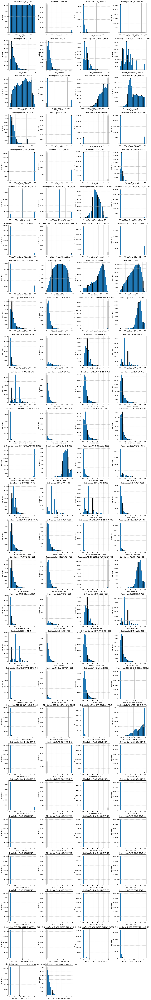

In [102]:
subplots_numeric_vars(app_train_df)

Como são muitas variáveis numéricas, é mais simples analisá-las por partes.

As variáveis **FLAG_DOCUMENT** são muito desbalanceadas. A maioria dos clientes não proveram grande parte dos documentos. Portanto, os clientes proverem ou não os documentos podem não agregar muito na previsão de risco de inadimplência.

In [103]:
def subplots_outliers(df):
    num_cols_subplot = 4  
    num_vars = df.select_dtypes(include=['number']).columns  
    num_rows = int(np.ceil(len(num_vars) / num_cols_subplot))  
    
    fig, axes = plt.subplots(num_rows, num_cols_subplot, figsize=(5 * num_cols_subplot, 4 * num_rows))  
    
    axes = axes.flatten()  # Transformar em array 1D para facilitar indexação

    for i, var in enumerate(num_vars):  
        sns.boxplot(x=df[var], ax=axes[i])  # Adiciona o subplot correto
        axes[i].set_title(f'Boxplot de {var}')
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)

    # Ocultar subplots vazios
    for j in range(i + 1, len(axes)):  
        fig.delaxes(axes[j])  # Remove os subplots não usados

    plt.tight_layout()
    plt.show()


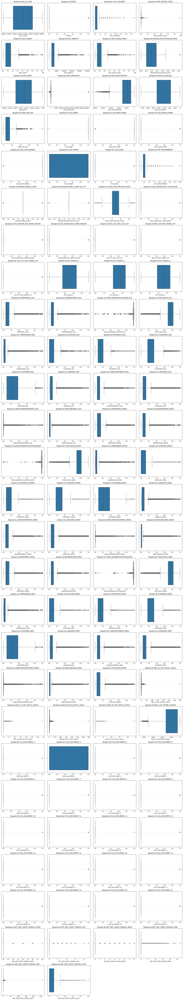

In [104]:
subplots_outliers(app_train_df)

In [105]:
#excluindo variáveis FLAG_DOCUMENT
columns_drop = []

for var in numerical_vars:
    if 'FLAG_DOCUMENT' in var :
        columns_drop.append(var)

print(columns_drop)

['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']


In [106]:
app_train_df_handled = app_train_df_handled.drop(columns=columns_drop, axis=1)

In [107]:
def plot_spearman_corr(df):
    df_corr_matrix = df[df.select_dtypes(include=['number']).columns].corr(method='spearman')

    plt.figure(figsize=(14,12))
    sns.heatmap(df_corr_matrix, annot=False, cmap='coolwarm', center=0, vmin=-1, vmax=1);
    plt.title("Correlação de Spearman")
    plt.show()

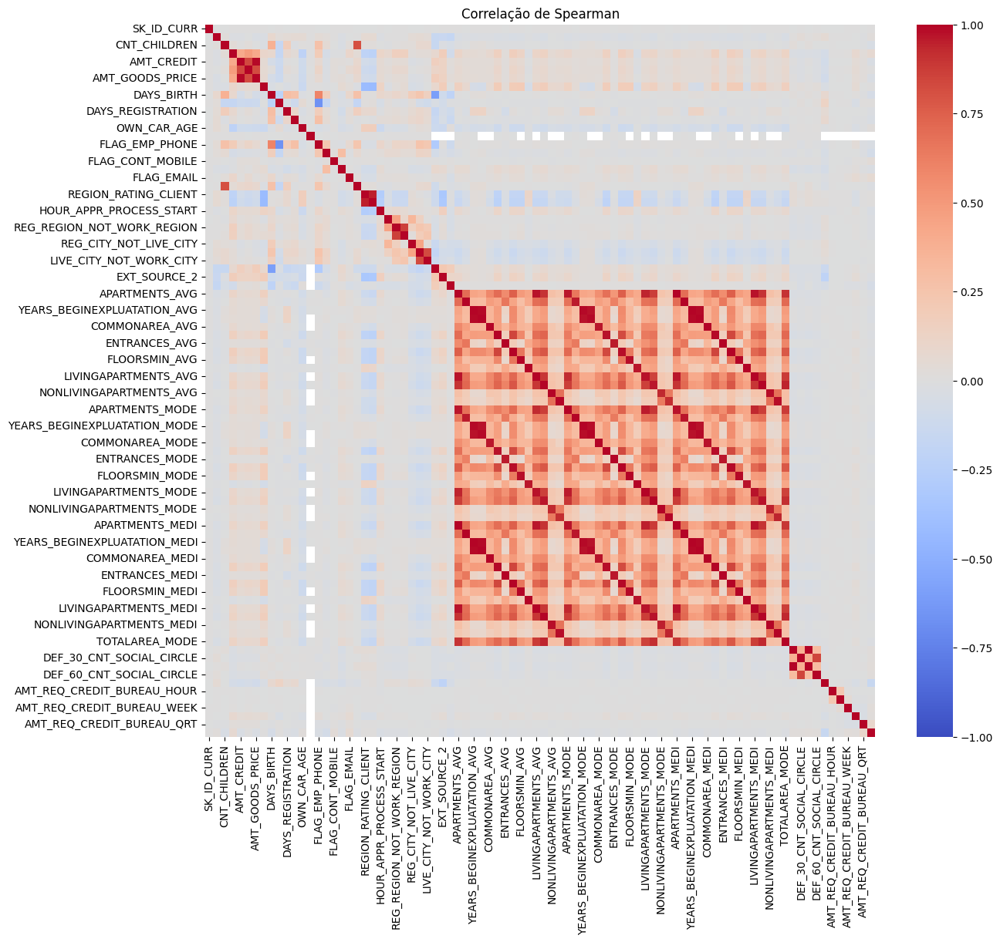

In [108]:
plot_spearman_corr(app_train_df_handled)

Através desse gráfico de correlação de Spearman, é possível observar que as variáveis independentes sobre a construção que o cliente vive são altamente **correlacionadas**, o que pode representar um problema de **multicolinearidade**.

Essas variáveis serem correlacionadas é algo esperado, isso por conta de padrões de construção de casas/apartamentos, ou de serem retiradas de uma banco de dados de uma imobiliária. Porém a questão da **redundância** e alta correlação, o que pode representar multiconlinearidade, aliada com uma alta porcentagem de valores missing, faz com que utilizar essas variáveis pareça inviável.

In [109]:
columns_to_drop = []

for var in app_train_df_handled.columns:
    if any(suffix in var for suffix in ['_AVG', '_MODE', '_MEDI']):
        columns_to_drop.append(var)

print(columns_to_drop)

['APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'TOTALAREA_MODE']


In [110]:
app_train_df_handled = app_train_df_handled.drop(columns=columns_to_drop, axis=1)

In [111]:
app_train_df_handled.dtypes

SK_ID_CURR                       int32
TARGET                            int8
NAME_CONTRACT_TYPE              object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                      int8
AMT_INCOME_TOTAL               float32
AMT_CREDIT                     float32
AMT_ANNUITY                    float32
AMT_GOODS_PRICE                float32
REGION_POPULATION_RELATIVE     float32
DAYS_BIRTH                       int16
DAYS_EMPLOYED                    int32
DAYS_REGISTRATION              float32
DAYS_ID_PUBLISH                  int16
OWN_CAR_AGE                    float32
FLAG_MOBIL                        int8
FLAG_EMP_PHONE                    int8
FLAG_WORK_PHONE                   int8
FLAG_CONT_MOBILE                  int8
FLAG_PHONE                        int8
FLAG_EMAIL                        int8
CNT_FAM_MEMBERS                float32
REGION_RATING_CLIENT              int8
REGION_RATING_CLIENT_W_CITY       int8
HOUR_APPR_PROCESS_START  

Há mais alguma variável numérica que podemos remover do dataframe? <br>

Podemos analisar o heatmap de correlação, a distribuição das variáveis e a porcentagem de missing values das variáveis, novamente

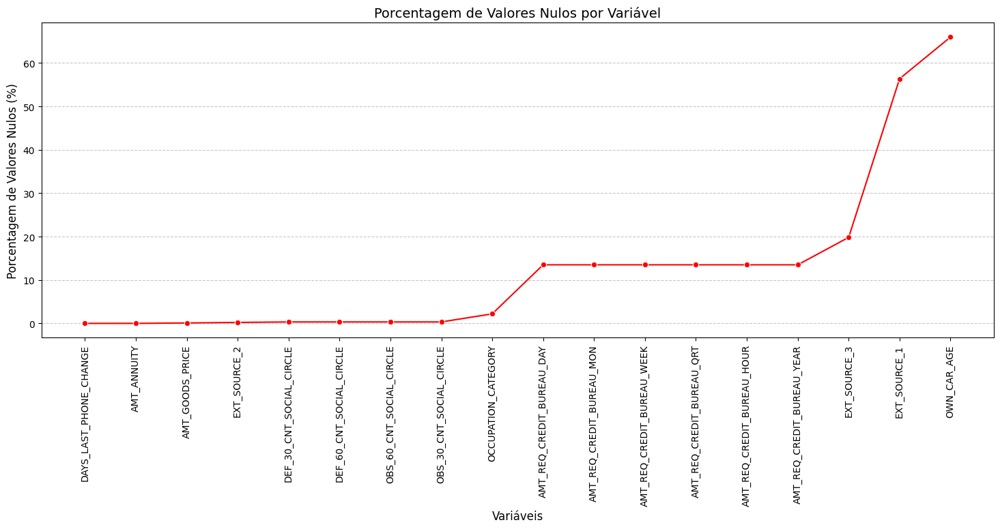

DAYS_LAST_PHONE_CHANGE         0.000325
AMT_ANNUITY                    0.003903
AMT_GOODS_PRICE                0.089767
EXT_SOURCE_2                   0.214659
DEF_30_CNT_SOCIAL_CIRCLE       0.331096
DEF_60_CNT_SOCIAL_CIRCLE       0.331096
OBS_60_CNT_SOCIAL_CIRCLE       0.331096
OBS_30_CNT_SOCIAL_CIRCLE       0.331096
OCCUPATION_CATEGORY            2.185947
AMT_REQ_CREDIT_BUREAU_DAY     13.495564
AMT_REQ_CREDIT_BUREAU_MON     13.495564
AMT_REQ_CREDIT_BUREAU_WEEK    13.495564
AMT_REQ_CREDIT_BUREAU_QRT     13.495564
AMT_REQ_CREDIT_BUREAU_HOUR    13.495564
AMT_REQ_CREDIT_BUREAU_YEAR    13.495564
EXT_SOURCE_3                  19.819556
EXT_SOURCE_1                  56.381235
OWN_CAR_AGE                   65.989839
dtype: float64

In [112]:
plot_missing_values(app_train_df_handled)

Vemos que as variáveis **EXT_SOURCE_1** e **OWN_CAR_AGE** possuem muitos valores nulos. <br>

**OWN_CAR_AGE** é uma feature que diz a idade do carro que o cliente tem. Porém, como nem todos os cliente vão ter carros, é entendível a quantidade de valores faltantes que essa variável possui. Ela pode ter relevância no modelo, porém não é uma variável que imputar valores seria interessante, pois isso pode gerar um entendimento de que clientes possuem carros, sendo que na realidade, eles não possuem.

**EXT_SOURCE_1** é uma feature que não diz muito. Ela é apenas um score normalizado do cliente de uma fonte externa. Portanto, com alta porcentagem de missing values, não faz sentido imputar valores e mantê-las na base de dados.

In [113]:
app_train_df_handled = app_train_df_handled.drop(columns=['OWN_CAR_AGE', 'EXT_SOURCE_1'])

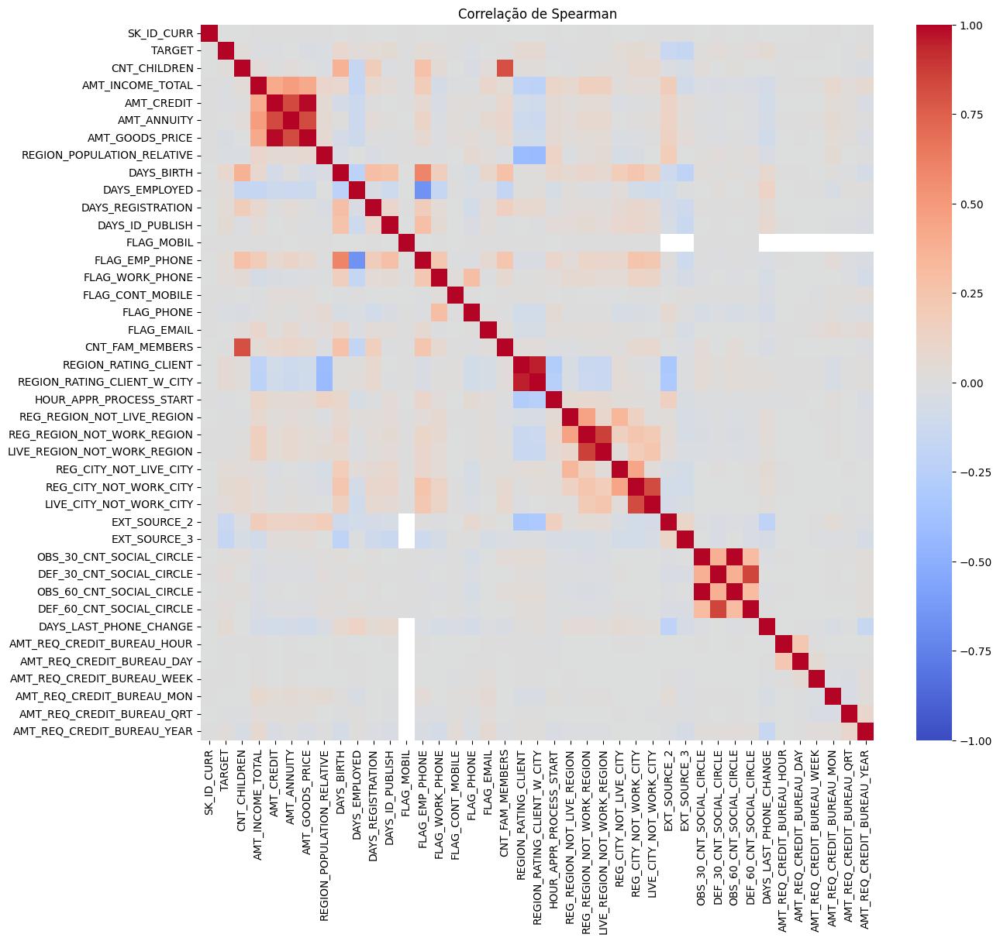

In [114]:
plot_spearman_corr(app_train_df_handled)

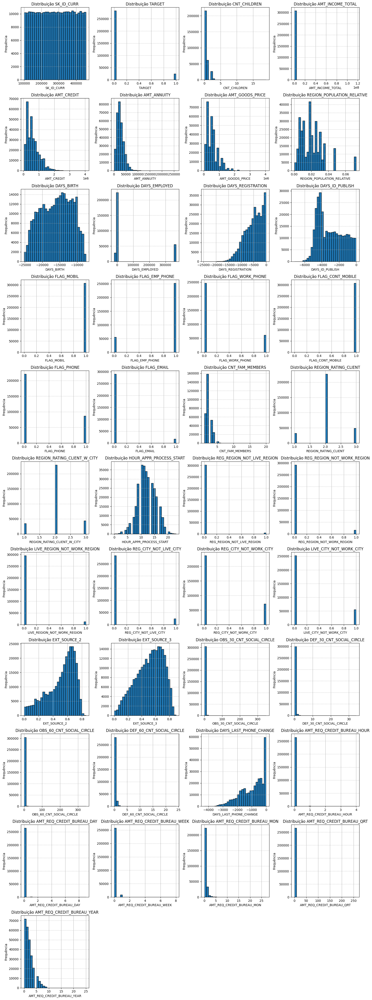

In [115]:
subplots_numeric_vars(app_train_df_handled)

In [116]:
app_train_df_handled.dtypes

SK_ID_CURR                       int32
TARGET                            int8
NAME_CONTRACT_TYPE              object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                      int8
AMT_INCOME_TOTAL               float32
AMT_CREDIT                     float32
AMT_ANNUITY                    float32
AMT_GOODS_PRICE                float32
REGION_POPULATION_RELATIVE     float32
DAYS_BIRTH                       int16
DAYS_EMPLOYED                    int32
DAYS_REGISTRATION              float32
DAYS_ID_PUBLISH                  int16
FLAG_MOBIL                        int8
FLAG_EMP_PHONE                    int8
FLAG_WORK_PHONE                   int8
FLAG_CONT_MOBILE                  int8
FLAG_PHONE                        int8
FLAG_EMAIL                        int8
CNT_FAM_MEMBERS                float32
REGION_RATING_CLIENT              int8
REGION_RATING_CLIENT_W_CITY       int8
HOUR_APPR_PROCESS_START           int8
REG_REGION_NOT_LIVE_REGIO

In [117]:
(app_train_df_handled['REG_REGION_NOT_LIVE_REGION'].value_counts(normalize=True)*100).round(2)

REG_REGION_NOT_LIVE_REGION
0    98.49
1     1.51
Name: proportion, dtype: float64

In [118]:
(app_train_df_handled['REG_REGION_NOT_WORK_REGION'].value_counts(normalize=True)*100).round(2)

REG_REGION_NOT_WORK_REGION
0    94.92
1     5.08
Name: proportion, dtype: float64

In [119]:
(app_train_df_handled['REG_CITY_NOT_LIVE_CITY'].value_counts(normalize=True)*100).round(2)

REG_CITY_NOT_LIVE_CITY
0    92.18
1     7.82
Name: proportion, dtype: float64

In [120]:
(app_train_df_handled['LIVE_REGION_NOT_WORK_REGION'].value_counts(normalize=True)*100).round(2)

LIVE_REGION_NOT_WORK_REGION
0    95.93
1     4.07
Name: proportion, dtype: float64

In [121]:
(app_train_df_handled['AMT_REQ_CREDIT_BUREAU_DAY'].value_counts(normalize=True)*100).round(2)

AMT_REQ_CREDIT_BUREAU_DAY
0.0    99.44
1.0     0.49
2.0     0.04
3.0     0.02
4.0     0.01
5.0     0.00
6.0     0.00
9.0     0.00
8.0     0.00
Name: proportion, dtype: float64

In [122]:
(app_train_df_handled['AMT_REQ_CREDIT_BUREAU_HOUR'].value_counts(normalize=True)*100).round(2)

AMT_REQ_CREDIT_BUREAU_HOUR
0.0    99.39
1.0     0.59
2.0     0.02
3.0     0.00
4.0     0.00
Name: proportion, dtype: float64

In [123]:
(app_train_df_handled['AMT_REQ_CREDIT_BUREAU_WEEK'].value_counts(normalize=True)*100).round(2)

AMT_REQ_CREDIT_BUREAU_WEEK
0.0    96.79
1.0     3.09
2.0     0.07
3.0     0.02
4.0     0.01
6.0     0.01
5.0     0.00
8.0     0.00
7.0     0.00
Name: proportion, dtype: float64

In [124]:
app_train_df_handled['AMT_REQ_CREDIT_BUREAU_YEAR'].value_counts()

AMT_REQ_CREDIT_BUREAU_YEAR
0.0     71790
1.0     63398
2.0     50188
3.0     33628
4.0     20714
5.0     12052
6.0      6967
7.0      3869
8.0      2127
9.0      1096
11.0       31
12.0       30
10.0       22
13.0       19
14.0       10
17.0        7
15.0        6
18.0        4
19.0        4
16.0        3
25.0        1
23.0        1
22.0        1
21.0        1
20.0        1
Name: count, dtype: int64

Excluindo variáveis com base na suas distribuições

In [125]:
drop_columns = ['FLAG_CONT_MOBILE', 'FLAG_MOBIL', 'FLAG_EMAIL', 'REG_REGION_NOT_LIVE_REGION', 
                'REG_REGION_NOT_WORK_REGION', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR', 
                'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 
                'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY']

app_train_df_handled = app_train_df_handled.drop(columns=drop_columns, axis=1)

Excluindo variáveis com base no bom senso(que não fazem sentido para a análise)

In [126]:
app_train_df_handled.dtypes

SK_ID_CURR                       int32
TARGET                            int8
NAME_CONTRACT_TYPE              object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                      int8
AMT_INCOME_TOTAL               float32
AMT_CREDIT                     float32
AMT_ANNUITY                    float32
AMT_GOODS_PRICE                float32
REGION_POPULATION_RELATIVE     float32
DAYS_BIRTH                       int16
DAYS_EMPLOYED                    int32
DAYS_REGISTRATION              float32
DAYS_ID_PUBLISH                  int16
FLAG_EMP_PHONE                    int8
FLAG_WORK_PHONE                   int8
FLAG_PHONE                        int8
CNT_FAM_MEMBERS                float32
REGION_RATING_CLIENT              int8
REGION_RATING_CLIENT_W_CITY       int8
HOUR_APPR_PROCESS_START           int8
REG_CITY_NOT_WORK_CITY            int8
LIVE_CITY_NOT_WORK_CITY           int8
EXT_SOURCE_2                   float32
EXT_SOURCE_3             

In [127]:
columns_drop = ['FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
               'HOUR_APPR_PROCESS_START', 'REGION_POPULATION_RELATIVE', 'REGION_RATING_CLIENT',
                'DAYS_BIRTH', 'DAYS_REGISTRATION']

app_train_df_handled = app_train_df_handled.drop(columns=columns_drop, axis=1)

In [128]:
app_train_df_handled.dtypes

SK_ID_CURR                       int32
TARGET                            int8
NAME_CONTRACT_TYPE              object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                      int8
AMT_INCOME_TOTAL               float32
AMT_CREDIT                     float32
AMT_ANNUITY                    float32
AMT_GOODS_PRICE                float32
DAYS_EMPLOYED                    int32
DAYS_ID_PUBLISH                  int16
CNT_FAM_MEMBERS                float32
REGION_RATING_CLIENT_W_CITY       int8
REG_CITY_NOT_WORK_CITY            int8
LIVE_CITY_NOT_WORK_CITY           int8
EXT_SOURCE_2                   float32
EXT_SOURCE_3                   float32
OBS_30_CNT_SOCIAL_CIRCLE       float32
DEF_30_CNT_SOCIAL_CIRCLE       float32
OBS_60_CNT_SOCIAL_CIRCLE       float32
DEF_60_CNT_SOCIAL_CIRCLE       float32
DAYS_LAST_PHONE_CHANGE         float32
AMT_REQ_CREDIT_BUREAU_YEAR     float32
ORGANIZATION_CATEGORY           object
OCCUPATION_CATEGORY      

## Dataset bureau

In [129]:
bureau_df['SK_ID_CURR'].value_counts()

SK_ID_CURR
120860    116
169704     94
318065     78
251643     61
425396     60
         ... 
213789      1
182913      1
133842      1
212349      1
402440      1
Name: count, Length: 305811, dtype: int64

### Análise de Missing Values

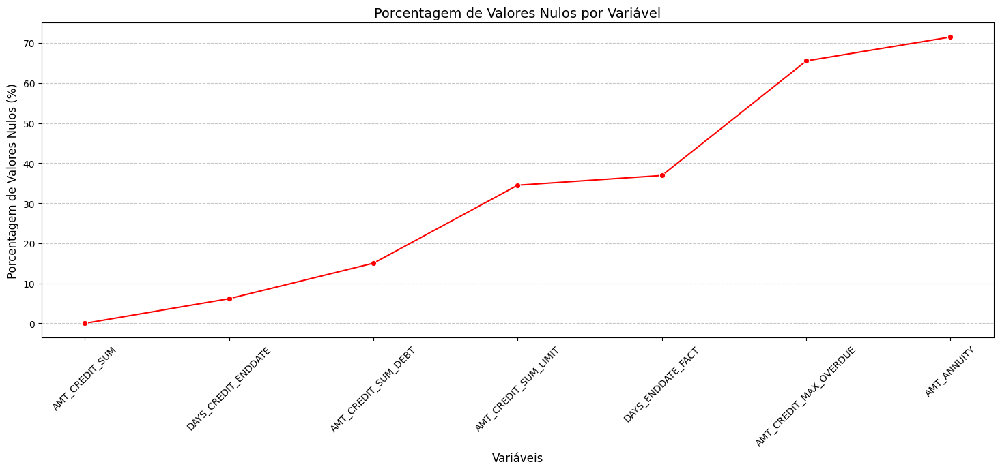

AMT_CREDIT_SUM             0.000757
DAYS_CREDIT_ENDDATE        6.149573
AMT_CREDIT_SUM_DEBT       15.011932
AMT_CREDIT_SUM_LIMIT      34.477415
DAYS_ENDDATE_FACT         36.916958
AMT_CREDIT_MAX_OVERDUE    65.513264
AMT_ANNUITY               71.473490
dtype: float64

In [130]:
plot_missing_values(bureau_df, 45)

Excluindo variáveis **AMT_CREDIT_MAX_OVERDUE** e **AMT_ANNUITY** pela alta quantidade de valores nulos

In [131]:
bureau_df_handled = bureau_df.copy()

In [132]:
bureau_df_handled = bureau_df_handled.drop(columns=['AMT_CREDIT_MAX_OVERDUE', 'AMT_ANNUITY'], axis=1)

### Análise da distribuição das variáveis categóricas

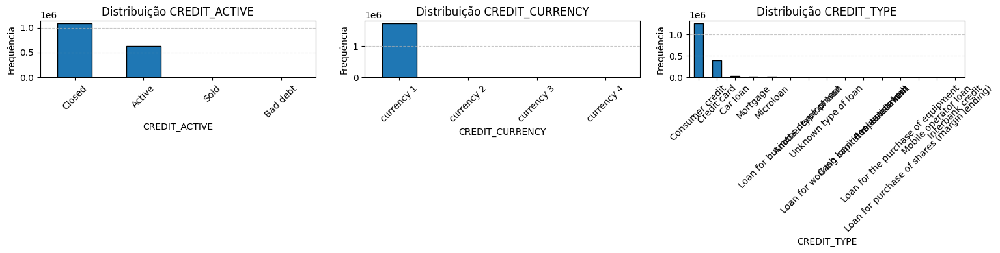

In [133]:
subplots_cat_vars(bureau_df)

A variável **CREDIT_TYPE** pode precisar de uma manipulação de categorias.

O que a variável **CREDIT_CURRENCY** quer passar como informação? Esse desbalanceamento das categorias agrega ao modelo? Vai diferenciar os clientes de alguma forma?

Excluindo **CREDIT_CURRENCY**

In [134]:
(bureau_df['CREDIT_CURRENCY'].value_counts(normalize=True)*100).round(2)

CREDIT_CURRENCY
currency 1    99.92
currency 2     0.07
currency 3     0.01
currency 4     0.00
Name: proportion, dtype: float64

In [135]:
bureau_df_handled = bureau_df_handled.drop(columns=['CREDIT_CURRENCY'], axis=1)

Manipulando **CREDIT_ACTIVE**

In [136]:
(bureau_df['CREDIT_ACTIVE'].value_counts(normalize=True)*100).round(2)

CREDIT_ACTIVE
Closed      62.88
Active      36.74
Sold         0.38
Bad debt     0.00
Name: proportion, dtype: float64

In [137]:
def categorizing_credit_active(credit):
    if credit == 'Sold' or credit == 'Bad debt':
        return 'Other'
    else:
        return credit

bureau_df_handled['CREDIT_STATUS'] = bureau_df_handled['CREDIT_ACTIVE'].apply(categorizing_credit_active)

In [138]:
bureau_df_handled['CREDIT_STATUS'].value_counts()

CREDIT_STATUS
Closed    1079273
Active     630607
Other        6548
Name: count, dtype: int64

In [139]:
bureau_df_handled = bureau_df_handled.drop(columns='CREDIT_ACTIVE', axis=1) #removendo a coluna original

Manipulando **CREDIT_TYPE**

In [140]:
(bureau_df['CREDIT_TYPE'].value_counts(normalize=True)*100).round(2)

CREDIT_TYPE
Consumer credit                                 72.92
Credit card                                     23.43
Car loan                                         1.61
Mortgage                                         1.07
Microloan                                        0.72
Loan for business development                    0.12
Another type of loan                             0.06
Unknown type of loan                             0.03
Loan for working capital replenishment           0.03
Cash loan (non-earmarked)                        0.00
Real estate loan                                 0.00
Loan for the purchase of equipment               0.00
Loan for purchase of shares (margin lending)     0.00
Mobile operator loan                             0.00
Interbank credit                                 0.00
Name: proportion, dtype: float64

In [141]:
bureau_df['CREDIT_TYPE'].value_counts()

CREDIT_TYPE
Consumer credit                                 1251615
Credit card                                      402195
Car loan                                          27690
Mortgage                                          18391
Microloan                                         12413
Loan for business development                      1975
Another type of loan                               1017
Unknown type of loan                                555
Loan for working capital replenishment              469
Cash loan (non-earmarked)                            56
Real estate loan                                     27
Loan for the purchase of equipment                   19
Loan for purchase of shares (margin lending)          4
Mobile operator loan                                  1
Interbank credit                                      1
Name: count, dtype: int64

In [142]:
credit_counts = bureau_df['CREDIT_TYPE'].value_counts()
credit_type_mapping = {credit: ("Other" if count < 30000 else credit) for credit, count in credit_counts.items()}
bureau_df_handled['CREDIT_TYPE_GROUP'] = bureau_df_handled['CREDIT_TYPE'].map(credit_type_mapping)

In [143]:
bureau_df_handled['CREDIT_TYPE_GROUP'].value_counts()

CREDIT_TYPE_GROUP
Consumer credit    1251615
Credit card         402195
Other                62618
Name: count, dtype: int64

In [144]:
bureau_df_handled = bureau_df_handled.drop(columns='CREDIT_TYPE', axis=1) #removendo a coluna original

### Análise da distribuição de variáveis numéricas

Refiz a conversão dos tipo float16 para float32 novamente, pois valores muito grandes ou muito pequenos estavam sendo convertidos incorretamente para inf ou valores errados

In [145]:
for col in bureau_df_handled.select_dtypes(include=['float16']).columns:
    bureau_df_handled[col] = bureau_df_handled[col].astype(np.float32)

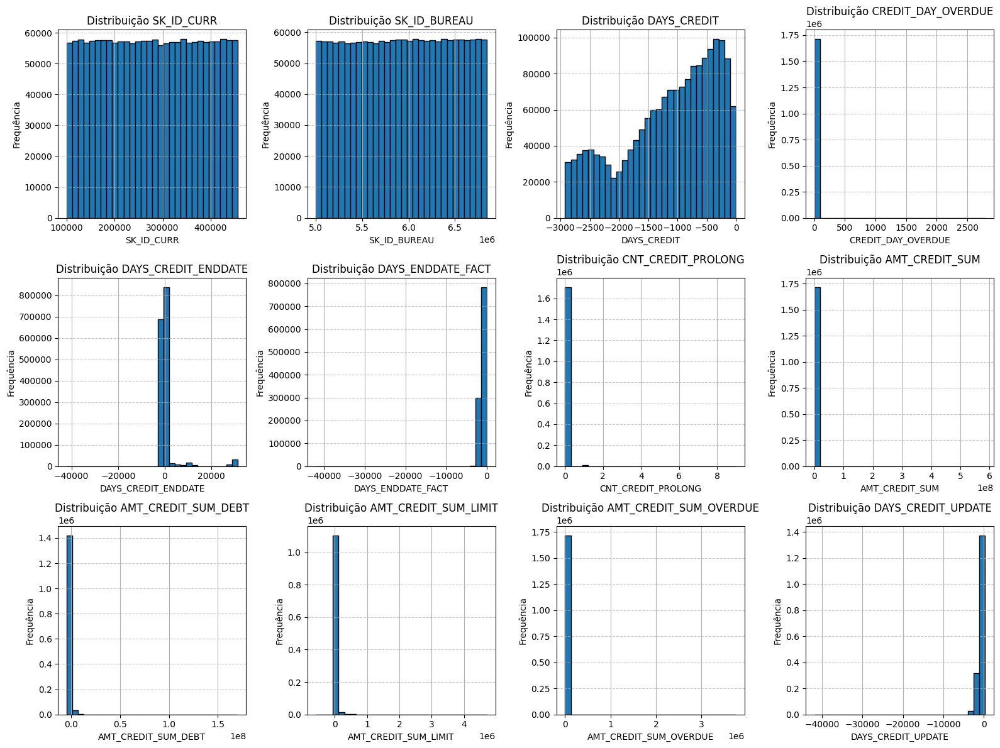

In [146]:
subplots_numeric_vars(bureau_df_handled)

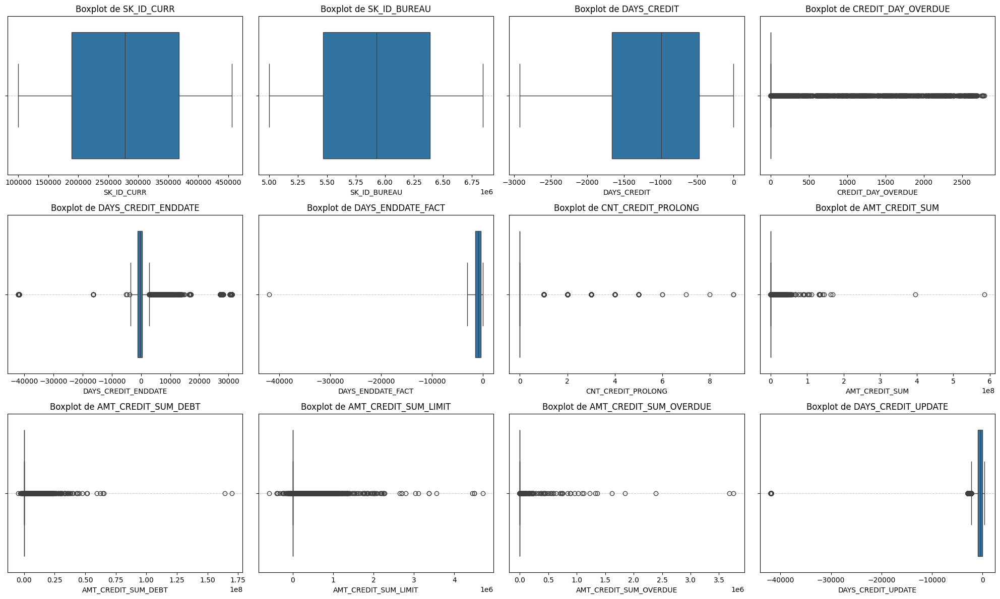

In [147]:
subplots_outliers(bureau_df_handled)

Através dos outliers evidenciados pelos boxplots, é possível visualizar de forma ainda mais clara o quanto algumas variáveis possuem distribuições desbalanceadas.

Manter essas variáveis não agrega ao aprendizado do algoritmo, só aumentando a sua complexidade e dimensionalidade.

In [148]:
(bureau_df_handled['CREDIT_DAY_OVERDUE'].value_counts(normalize=True)*100).round(2)

CREDIT_DAY_OVERDUE
0       99.75
30       0.02
60       0.01
13       0.01
8        0.01
9        0.01
7        0.01
14       0.01
17       0.00
11       0.00
15       0.00
10       0.00
12       0.00
20       0.00
21       0.00
18       0.00
6        0.00
22       0.00
19       0.00
5        0.00
28       0.00
16       0.00
4        0.00
29       0.00
26       0.00
24       0.00
23       0.00
25       0.00
31       0.00
32       0.00
34       0.00
150      0.00
37       0.00
41       0.00
35       0.00
3        0.00
38       0.00
27       0.00
40       0.00
90       0.00
120      0.00
39       0.00
44       0.00
43       0.00
36       0.00
33       0.00
52       0.00
2        0.00
46       0.00
48       0.00
50       0.00
49       0.00
69       0.00
55       0.00
53       0.00
73       0.00
65       0.00
54       0.00
68       0.00
64       0.00
45       0.00
61       0.00
51       0.00
56       0.00
58       0.00
67       0.00
77       0.00
42       0.00
79       0.00
76       0.00
5

In [149]:
(bureau_df_handled['AMT_CREDIT_SUM_DEBT'].value_counts(normalize=True)*100).round(2)

AMT_CREDIT_SUM_DEBT
 0.000000         69.68
 4.500000          0.04
-450.000000        0.04
 135000.000000     0.02
 90000.000000      0.02
                  ...  
 803992.500000     0.00
 20614.140625      0.00
 650497.500000     0.00
 189738.000000     0.00
 92486.562500      0.00
Name: proportion, Length: 226527, dtype: float64

In [150]:
bureau_df_handled['AMT_CREDIT_SUM_DEBT'].value_counts()

AMT_CREDIT_SUM_DEBT
 0.000000         1016434
 4.500000             653
-450.000000           543
 135000.000000        344
 90000.000000         320
                   ...   
 803992.500000          1
 20614.140625           1
 650497.500000          1
 189738.000000          1
 92486.562500           1
Name: count, Length: 226527, dtype: int64

In [151]:
neg_values_amt_credit_sum_debt = (bureau_df_handled['AMT_CREDIT_SUM_DEBT'] < 0.0).sum()
print(neg_values_amt_credit_sum_debt)

8418


In [152]:
bureau_df_handled[bureau_df_handled['AMT_CREDIT_SUM_DEBT'] < 0]

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,CREDIT_STATUS,CREDIT_TYPE_GROUP
21,222183,5714491,-784,0,1008.0,NaN,0,0.0,-411.614990,411.614990,0.0,-694,Active,Credit card
87,119939,5714568,-1447,0,-331.0,-1272.0,0,99000.0,-2692.169922,137692.171875,0.0,-1272,Closed,Credit card
88,119939,5714569,-1390,0,-331.0,-1263.0,0,135000.0,-149.039993,135149.046875,0.0,-1263,Closed,Credit card
89,119939,5714570,-1390,0,-696.0,NaN,0,4500.0,-2.565000,2.565000,0.0,-691,Active,Credit card
125,293201,5714621,-2389,0,-1365.0,-1780.0,0,225000.0,-701.280029,225701.281250,0.0,-1780,Closed,Credit card
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1715066,234436,5080818,-1000,0,832.0,NaN,0,0.0,-23.219999,23.219999,0.0,-604,Active,Credit card
1715101,292494,5087696,-2674,0,-1564.0,-1670.0,0,225000.0,-36.180000,22536.179688,0.0,-535,Closed,Credit card
1715271,228547,5044511,-1663,0,1211.0,NaN,0,135000.0,-1066.275024,136066.281250,0.0,-640,Active,Credit card
1715929,214607,5056789,-1491,0,-374.0,-643.0,0,135000.0,-35.055000,135035.062500,0.0,-643,Closed,Credit card


As colunas **DAYS_CREDIT**, **DAYS_CREDIT_ENDDATE** geralmente são medidas em dias a partir de um ponto de referência (exemplo: dias desde a concessão do crédito). Portanto, valores negativos significam que o evento ocorreu no passado, ou seja, há X dias atrás. E valores positivos indicam que o evento vai acontecer no futuro(ou terminou de acontecer).

In [153]:
(bureau_df_handled['AMT_CREDIT_SUM_LIMIT'].value_counts(normalize=True)*100).round(2)

AMT_CREDIT_SUM_LIMIT
0.000000e+00    93.38
1.350000e+05     0.19
4.500000e+03     0.13
4.500000e+04     0.12
9.000000e+04     0.09
                ...  
4.946400e+04     0.00
1.004867e+06     0.00
1.343382e+05     0.00
7.587576e+04     0.00
1.872585e+03     0.00
Name: proportion, Length: 51726, dtype: float64

In [154]:
(bureau_df_handled['AMT_CREDIT_SUM_OVERDUE'].value_counts(normalize=True)*100).round(2)

AMT_CREDIT_SUM_OVERDUE
0.000000         99.76
4.500000          0.02
9.000000          0.01
13.500000         0.00
18.000000         0.00
                 ...  
5069.069824       0.00
142.830002        0.00
88.695000         0.00
323.010010        0.00
185224.500000     0.00
Name: proportion, Length: 1616, dtype: float64

In [155]:
(bureau_df_handled['CNT_CREDIT_PROLONG'].value_counts(normalize=True)*100).round(2)

CNT_CREDIT_PROLONG
0    99.47
1     0.44
2     0.07
3     0.01
4     0.00
5     0.00
9     0.00
6     0.00
8     0.00
7     0.00
Name: proportion, dtype: float64

In [156]:
(bureau_df_handled['DAYS_CREDIT_ENDDATE'].value_counts(normalize=True)*100).round(2)

DAYS_CREDIT_ENDDATE
 0.0       0.05
 3.0       0.05
-7.0       0.05
 1.0       0.05
-14.0      0.05
           ... 
 3777.0    0.00
 6454.0    0.00
 5643.0    0.00
 8052.0    0.00
 6009.0    0.00
Name: proportion, Length: 14096, dtype: float64

Excluindo variáveis que não agregam à análise

In [157]:
bureau_df_handled = bureau_df_handled.drop(columns=['CREDIT_DAY_OVERDUE', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'CNT_CREDIT_PROLONG'], axis=1)

In [158]:
bureau_df_handled.dtypes

SK_ID_CURR               int32
SK_ID_BUREAU             int32
DAYS_CREDIT              int16
DAYS_CREDIT_ENDDATE    float32
DAYS_ENDDATE_FACT      float32
AMT_CREDIT_SUM         float32
AMT_CREDIT_SUM_DEBT    float32
DAYS_CREDIT_UPDATE       int32
CREDIT_STATUS           object
CREDIT_TYPE_GROUP       object
dtype: object

## Dataset bureau_balance

In [159]:
bureau_bal_df.shape

(27299925, 3)

### Análise de missing values

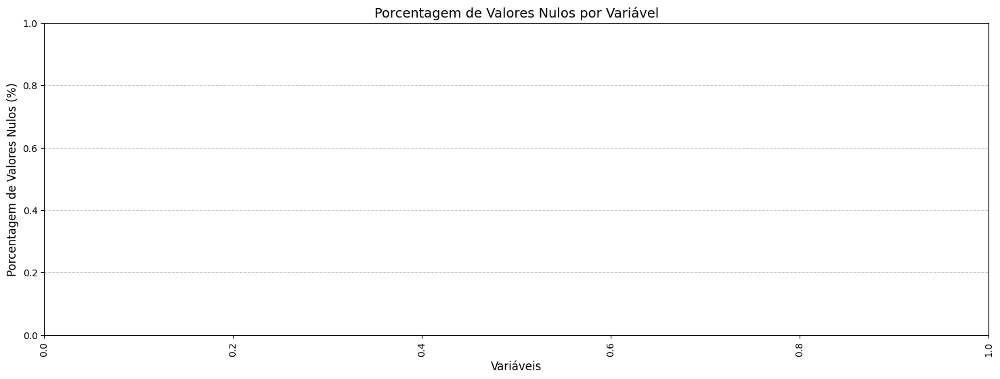

Series([], dtype: float64)

In [160]:
plot_missing_values(bureau_bal_df)

O dataset bureau_balance **não possui missing values**

### Análise de variáveis categóricas

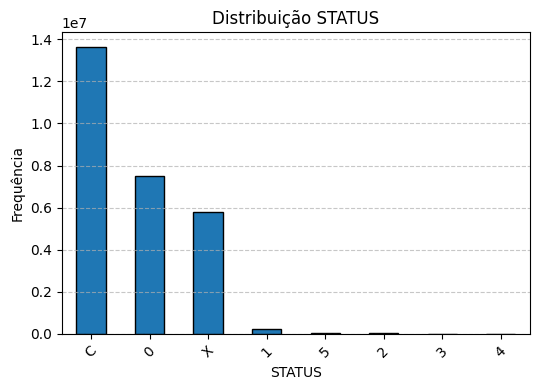

In [161]:
subplots_cat_vars(bureau_bal_df)

**STATUS** diz o status do empréstimo durante o mês da coleta dos dados

*DPD(Day Past Due) significa basicamente dias de atraso no pagamento*

- **C** - closed (empréstimo fechado)
- **X** - status unknown (status desconhecido)
- **0** - means no DPD (sem atraso)
- **1** - means maximal did during month between 1-30 (atraso no pagamento entre 1 e 30 dias)
- **2** - means DPD 31-60 (atraso entre 31 e 60 dias)
- **3** - *Não legível, provavelmente atraso de 3 meses*
- **4** - *Não legível, provavelmente atraso de 4 meses* 
- **5** - means DPD 120+ or sold or written off (atraso de mais de 120 dias, ou crédito vendido, ou prejuízo)

Como o **SK_ID_BUREAU** é o ID de cada crédito anterior, é possível obter informações importantes sobre clientes com maior **tendência a atrasos ou inadimplência**, de acordo com essas categorias.

In [162]:
bureau_bal_df['STATUS'].value_counts()

STATUS
C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: count, dtype: int64

In [163]:
(bureau_bal_df['STATUS'].value_counts(normalize=True)*100).round(2)

STATUS
C    49.99
0    27.47
X    21.28
1     0.89
5     0.23
2     0.09
3     0.03
4     0.02
Name: proportion, dtype: float64

In [164]:
bureau_bal_df_handled = bureau_bal_df.copy()

In [165]:
def categorizing_status_bureau(status):
    if status == 'C':
        return 'Closed'
    elif status == 'X':
        return 'Unknown'
    elif status == '0':
        return 'No DPD'
    elif status == '1':
        return 'Low DPD'
    elif status in ['2', '3']:
        return 'Medium DPD'
    else:
        return 'High DPD'

bureau_bal_df_handled['STATUS_BUREAU'] = bureau_bal_df_handled['STATUS'].apply(categorizing_status_bureau)

In [166]:
bureau_bal_df_handled['STATUS_BUREAU'].value_counts()

STATUS_BUREAU
Closed        13646993
No DPD         7499507
Unknown        5810482
Low DPD         242347
High DPD         68253
Medium DPD       32343
Name: count, dtype: int64

In [167]:
bureau_bal_df_handled = bureau_bal_df_handled.drop(columns=['STATUS'], axis=1)

### Análise de variáveis numéricas

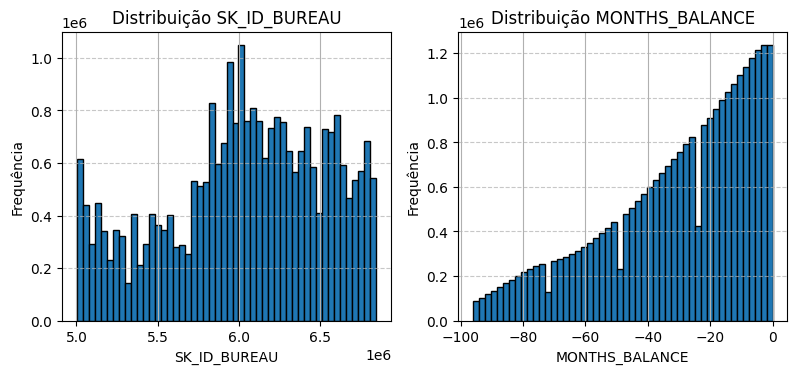

In [168]:
subplots_numeric_vars(bureau_bal_df, 50)

In [169]:
bureau_bal_5715448 = bureau_bal_df_handled[bureau_bal_df_handled['SK_ID_BUREAU'] == 5715448] 
bureau_bal_5715448

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS_BUREAU
0,5715448,0,Closed
1,5715448,-1,Closed
2,5715448,-2,Closed
3,5715448,-3,Closed
4,5715448,-4,Closed
5,5715448,-5,Closed
6,5715448,-6,Closed
7,5715448,-7,Closed
8,5715448,-8,Closed
9,5715448,-9,No DPD


Nesse dataset é interessante visualizar que para cada ID de crédito, existe o status do pagamento do empréstimo de cada mês(quanto menor o valor de **MONTHS_BALANCE**, mais recente). Portanto, **importantes conclusões sobre risco de inadimplência podem ser tomados**.

## Dataset previous application

In [170]:
prev_app_df.shape

(1670214, 37)

### Análise de missing values

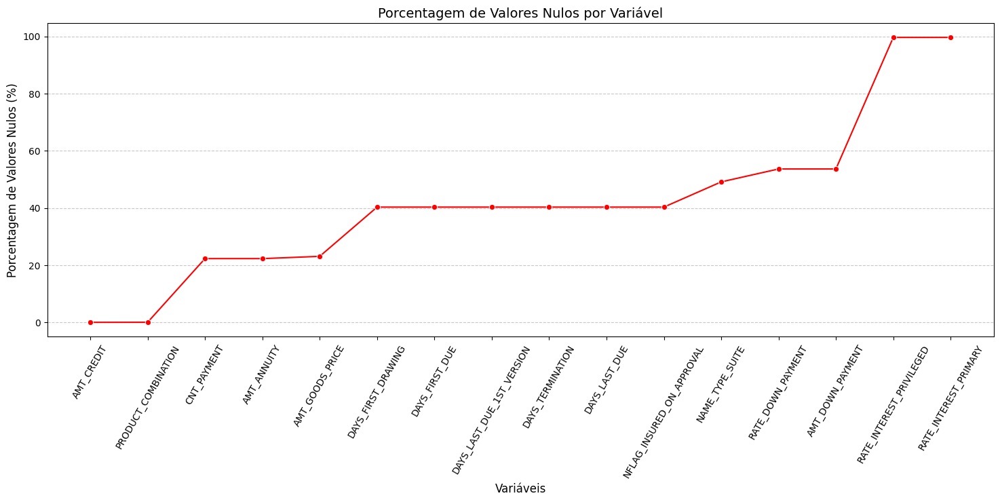

AMT_CREDIT                    0.000060
PRODUCT_COMBINATION           0.020716
CNT_PAYMENT                  22.286366
AMT_ANNUITY                  22.286665
AMT_GOODS_PRICE              23.081773
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_TERMINATION             40.298129
DAYS_LAST_DUE                40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
NAME_TYPE_SUITE              49.119754
RATE_DOWN_PAYMENT            53.636480
AMT_DOWN_PAYMENT             53.636480
RATE_INTEREST_PRIVILEGED     99.643698
RATE_INTEREST_PRIMARY        99.643698
dtype: float64

In [171]:
plot_missing_values(prev_app_df, 60)

In [172]:
prev_app_df_handled = prev_app_df.copy()

Excluindo variáveis com alto percentual de valores nulos

In [173]:
prev_app_df_handled = prev_app_df_handled.drop(columns=['RATE_INTEREST_PRIVILEGED', 'RATE_INTEREST_PRIMARY'])

### Análise de variáveis categóricas

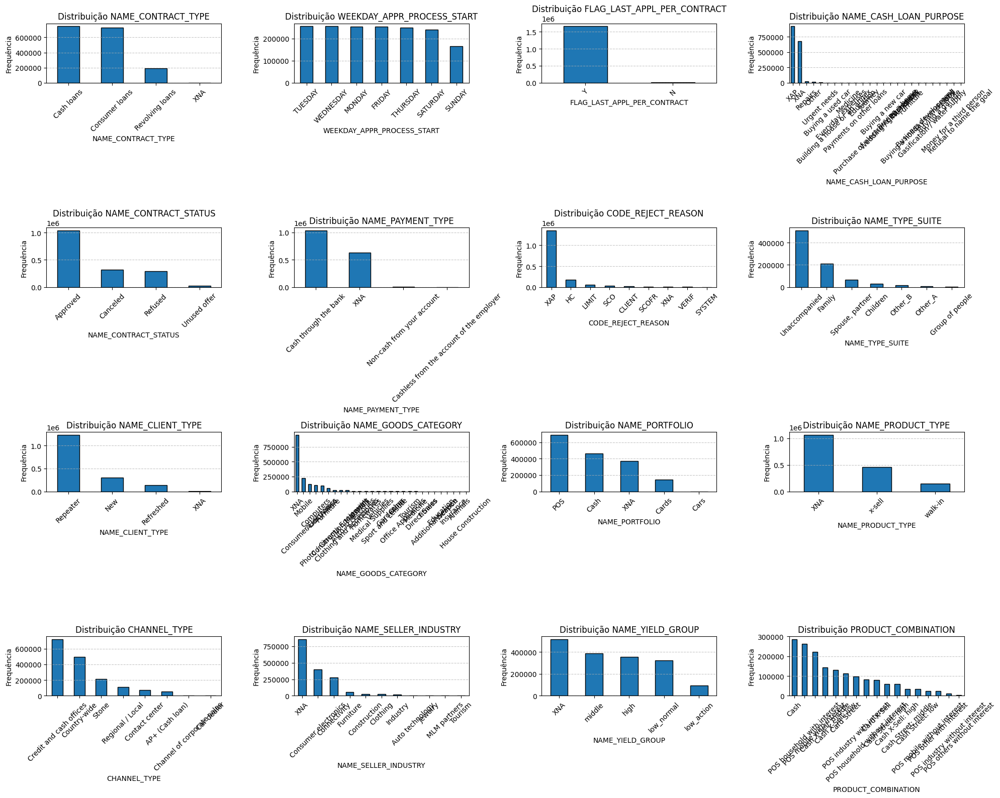

In [174]:
subplots_cat_vars(prev_app_df_handled)

Excluindo variáveis que não vão influenciar na análise

In [175]:
(prev_app_df_handled['FLAG_LAST_APPL_PER_CONTRACT'].value_counts(normalize=True)*100).round(2)

FLAG_LAST_APPL_PER_CONTRACT
Y    99.49
N     0.51
Name: proportion, dtype: float64

In [176]:
(prev_app_df_handled['NAME_CASH_LOAN_PURPOSE'].value_counts(normalize=True)*100).round(2)

NAME_CASH_LOAN_PURPOSE
XAP                                 55.24
XNA                                 40.59
Repairs                              1.42
Other                                0.93
Urgent needs                         0.50
Buying a used car                    0.17
Building a house or an annex         0.16
Everyday expenses                    0.14
Medicine                             0.13
Payments on other loans              0.12
Education                            0.09
Journey                              0.07
Purchase of electronic equipment     0.06
Buying a new car                     0.06
Wedding / gift / holiday             0.06
Buying a home                        0.05
Car repairs                          0.05
Furniture                            0.04
Buying a holiday home / land         0.03
Business development                 0.03
Gasification / water supply          0.02
Buying a garage                      0.01
Hobby                                0.00
Money for a

A variável **NAME_CASH_LOAN_PURPOSE** que era pra indicar o propósito que o empréstimo foi realizado parece não passar uma quantidade suficiente de informações, visto que uma das categorias com mais ocorrências é XNA, outras categorias mais descritivas possuem poquíssimas ocorrências.

Além do mais, seria uma variável complexa de fazer um reagrupamento.

In [177]:
(prev_app_df_handled['CODE_REJECT_REASON'].value_counts(normalize=True)*100).round(2)

CODE_REJECT_REASON
XAP       81.01
HC        10.49
LIMIT      3.33
SCO        2.24
CLIENT     1.58
SCOFR      0.77
XNA        0.31
VERIF      0.21
SYSTEM     0.04
Name: proportion, dtype: float64

In [178]:
(prev_app_df_handled['NAME_GOODS_CATEGORY'].value_counts(normalize=True)*100).round(2)

NAME_GOODS_CATEGORY
XNA                         56.93
Mobile                      13.45
Consumer Electronics         7.28
Computers                    6.33
Audio/Video                  5.95
Furniture                    3.21
Photo / Cinema Equipment     1.50
Construction Materials       1.50
Clothing and Accessories     1.41
Auto Accessories             0.44
Jewelry                      0.38
Homewares                    0.30
Medical Supplies             0.23
Vehicles                     0.20
Sport and Leisure            0.18
Gardening                    0.16
Other                        0.15
Office Appliances            0.14
Tourism                      0.10
Medicine                     0.09
Direct Sales                 0.03
Fitness                      0.01
Additional Service           0.01
Education                    0.01
Weapon                       0.00
Insurance                    0.00
Animals                      0.00
House Construction           0.00
Name: proportion, dtype: flo

A variável **NAME_GOODS_CATEGORY** tem muitas ocorrências de XNA, porém não desbalanceia totalmente a variável pois existem outras categorias com certos números de ocorrências.

Porém também seria uma variável complexa de se tratar/agrupar.

In [179]:
prev_app_df_handled[['AMT_GOODS_PRICE', 'NAME_GOODS_CATEGORY']]

,AMT_GOODS_PRICE,NAME_GOODS_CATEGORY
0,17145.0,Mobile
1,607500.0,XNA
2,112500.0,XNA
3,450000.0,XNA
4,337500.0,XNA
...,...,...
1670209,267295.5,Furniture
1670210,87750.0,Furniture
1670211,105237.0,Consumer Electronics
1670212,180000.0,XNA


Removendo variáveis que não vão contribuir para a análise

In [180]:
prev_app_df_handled = prev_app_df_handled.drop(columns=['WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_TYPE_SUITE'])

### Análise de variáveis numéricas

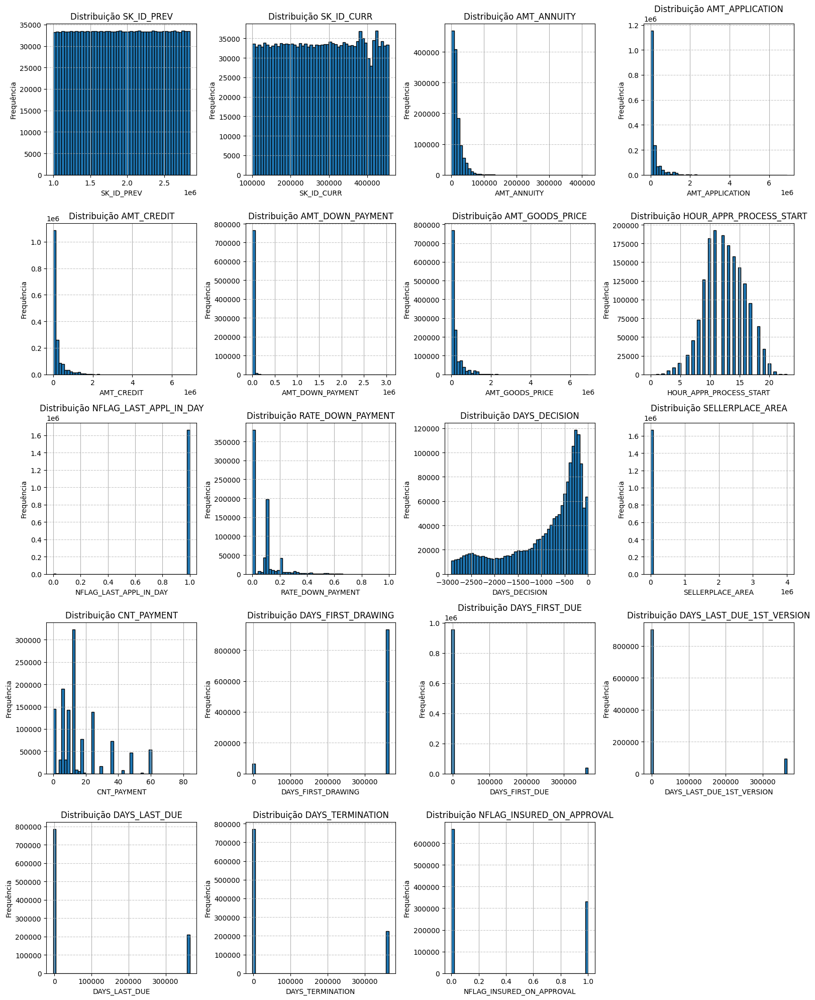

In [181]:
subplots_numeric_vars(prev_app_df_handled, 50)

In [182]:
(prev_app_df_handled['NFLAG_LAST_APPL_IN_DAY'].value_counts(normalize=True)*100).round(2)

NFLAG_LAST_APPL_IN_DAY
1    99.65
0     0.35
Name: proportion, dtype: float64

In [183]:
(prev_app_df_handled['SELLERPLACE_AREA'].value_counts(normalize=True)*100).round(2)

SELLERPLACE_AREA
-1       45.66
 0        3.62
 50       2.24
 30       2.06
 20       2.03
         ...  
 3314     0.00
 1409     0.00
 1697     0.00
 2796     0.00
 2347     0.00
Name: proportion, Length: 2097, dtype: float64

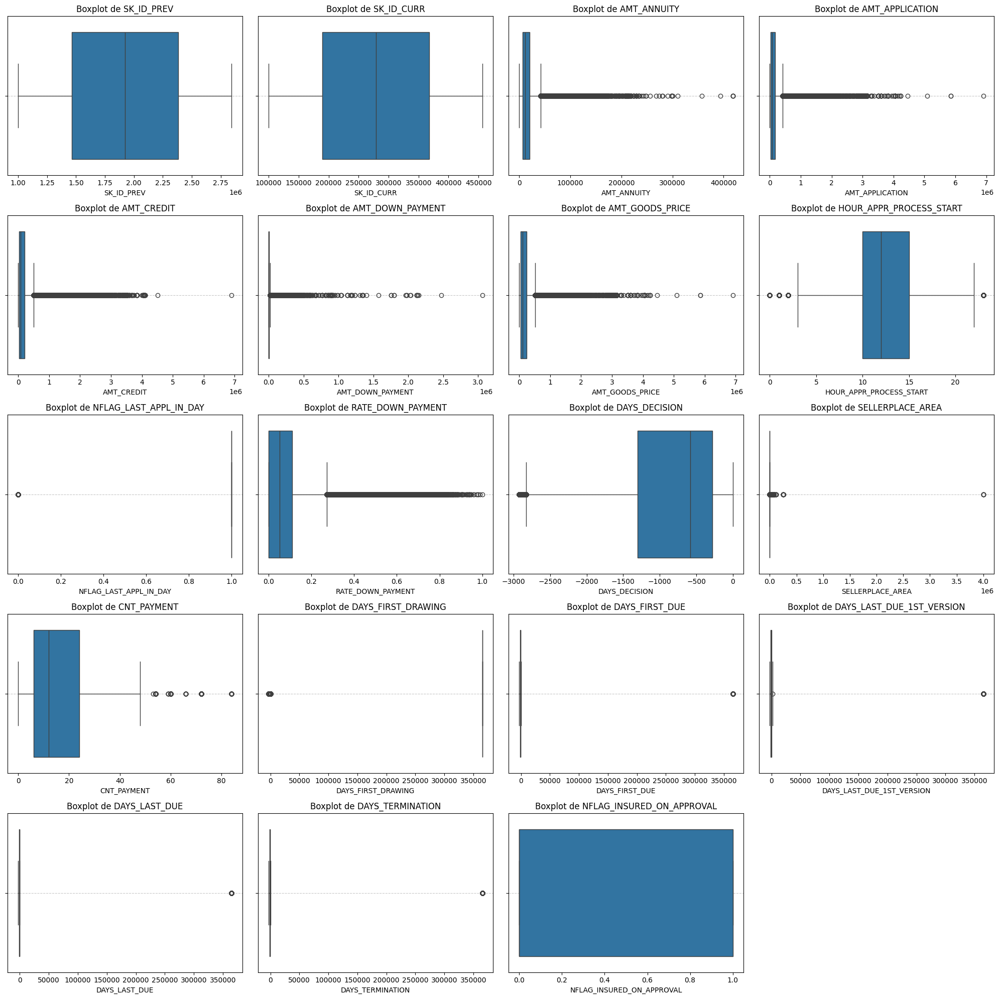

In [184]:
subplots_outliers(prev_app_df_handled)

In [185]:
prev_app_df_handled[['DAYS_FIRST_DUE', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_TERMINATION', 'SELLERPLACE_AREA']].max()

DAYS_FIRST_DUE                365243.0
DAYS_LAST_DUE                 365243.0
DAYS_TERMINATION              365243.0
DAYS_LAST_DUE_1ST_VERSION     365243.0
DAYS_TERMINATION              365243.0
SELLERPLACE_AREA             4000000.0
dtype: float64

Os registros com valores *365243.0* acabam distorcendo a distribuição dessas variáveis

Variáveis numéricas que poderiam ser excluídas por não agregarem na análise

In [186]:
prev_app_df_handled = prev_app_df_handled.drop(columns=['NFLAG_LAST_APPL_IN_DAY', 'HOUR_APPR_PROCESS_START'])

Talvez esse dataset não seja muito interessante de ser utilizado para treinar o modelo. Tanto pela quatidade de variáveis categóricas...

## Dataset POS_CASH_balance

In [187]:
pos_cash_bal_df['SK_ID_PREV'].value_counts()

SK_ID_PREV
1136347    96
2558266    96
1323166    96
1911371    96
1412318    96
           ..
2060353     1
1468455     1
2056173     1
1133391     1
1085876     1
Name: count, Length: 936325, dtype: int64

In [188]:
pos_cash_bal_df['SK_ID_CURR'].value_counts()

SK_ID_CURR
265042    295
172612    247
309133    246
197583    245
127659    245
         ... 
203120      1
274925      1
281029      1
224555      1
169377      1
Name: count, Length: 337252, dtype: int64

Para cada empréstimo, pode-se ter vários registros que representam o balanço mensal referente a esse empréstimo

In [189]:
pos_cash_bal_df[['SK_ID_CURR', 'MONTHS_BALANCE']].sort_values(by=['SK_ID_CURR', 'MONTHS_BALANCE'])

,SK_ID_CURR,MONTHS_BALANCE
1261679,100001,-96
1891462,100001,-95
8531326,100001,-94
4928574,100001,-93
7167007,100001,-57
...,...,...
3839119,456255,-6
4876277,456255,-5
615709,456255,-4
2489728,456255,-3


### Análise de missing values

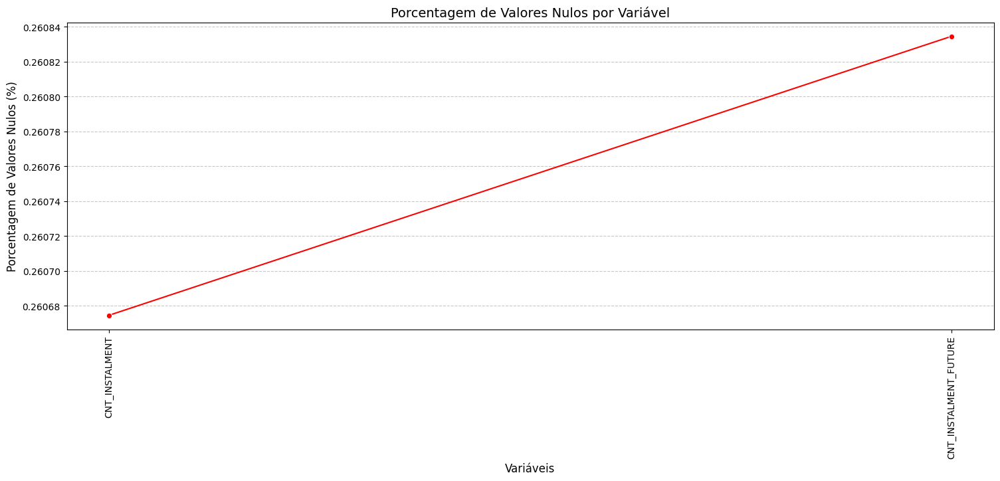

CNT_INSTALMENT           0.260675
CNT_INSTALMENT_FUTURE    0.260835
dtype: float64

In [190]:
plot_missing_values(pos_cash_bal_df)

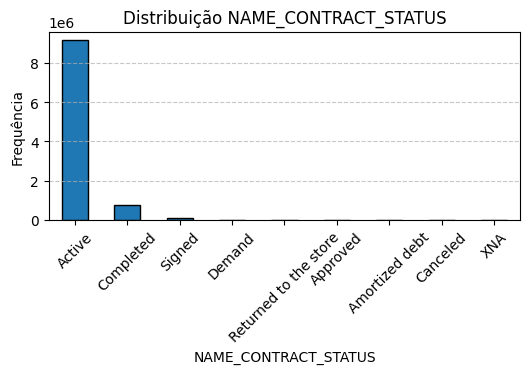

In [191]:
subplots_cat_vars(pos_cash_bal_df)

In [192]:
pos_cash_bal_df_handled = pos_cash_bal_df.copy()

In [193]:
(pos_cash_bal_df['NAME_CONTRACT_STATUS'].value_counts(normalize=True)*100).round(2)

NAME_CONTRACT_STATUS
Active                   91.50
Completed                 7.45
Signed                    0.87
Demand                    0.07
Returned to the store     0.05
Approved                  0.05
Amortized debt            0.01
Canceled                  0.00
XNA                       0.00
Name: proportion, dtype: float64

In [194]:
def categorizing_contract_status(status):
    if status in ['Active', 'Signed', 'Approved']:
        return 'Active'
    elif status in ['Completed', 'Amortized debt']:
        return 'Completed'
    else:
        return 'Canceled'

pos_cash_bal_df_handled['CONTRACT_STATUS'] = pos_cash_bal_df['NAME_CONTRACT_STATUS'].apply(categorizing_contract_status)

In [195]:
pos_cash_bal_df_handled['CONTRACT_STATUS'].value_counts()

CONTRACT_STATUS
Active       9243296
Completed     745519
Canceled       12543
Name: count, dtype: int64

In [196]:
pos_cash_bal_df_handled = pos_cash_bal_df_handled.drop(columns='NAME_CONTRACT_STATUS', axis=1)

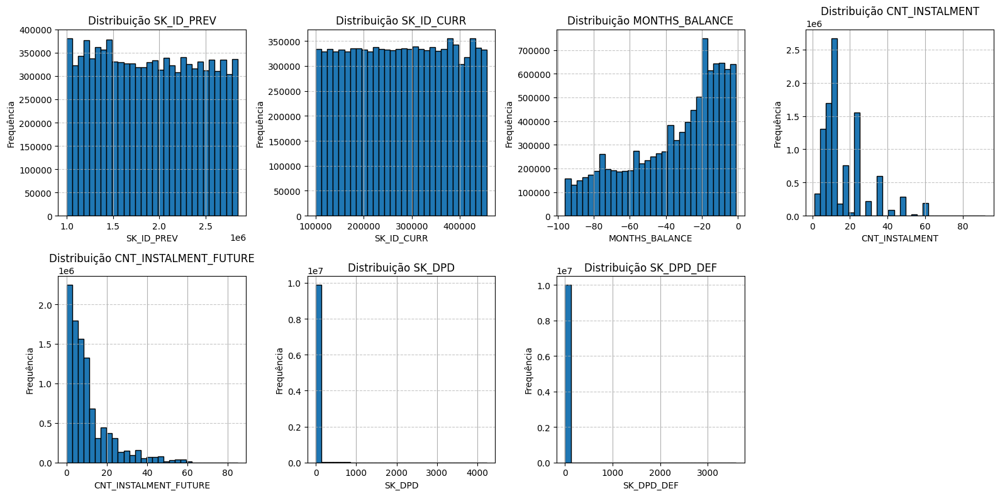

In [197]:
subplots_numeric_vars(pos_cash_bal_df)

**CNT_INSTALLMENT_FUTURE** provavelmente é uma variável importante para o modelo, pois diz a cada mês a quantidade de parcelas restantes de se pagar de um crédito anterior

In [198]:
pos_cash_bal_df[pos_cash_bal_df['SK_ID_CURR'] == 100001].sort_values(by=['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE'])

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
7167007,1369693,100001,-57,4.0,4.0,Active,0,0
8789081,1369693,100001,-56,4.0,3.0,Active,0,0
7823681,1369693,100001,-55,4.0,2.0,Active,0,0
4704415,1369693,100001,-54,4.0,1.0,Active,0,0
2197888,1369693,100001,-53,4.0,0.0,Completed,0,0
1261679,1851984,100001,-96,4.0,2.0,Active,0,0
1891462,1851984,100001,-95,4.0,1.0,Active,7,7
8531326,1851984,100001,-94,4.0,0.0,Active,0,0
4928574,1851984,100001,-93,4.0,0.0,Completed,0,0


In [199]:
prev_app_df_handled[prev_app_df_handled['SK_ID_PREV'] == 1369693]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,RATE_DOWN_PAYMENT,NAME_CASH_LOAN_PURPOSE,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
201668,1369693,100001,Consumer loans,3951.0,24835.5,23787.0,2520.0,24835.5,0.104326,XAP,...,Connectivity,8.0,high,POS mobile with interest,365243.0,-1709.0,-1499.0,-1619.0,-1612.0,0.0


É possível observar que cada empréstimo pode ter várias aplicações anteriores, e o contrato fica ativo enquanto as parcelas não terminaram de serem pagas, evidenciado pelas variáveis **CNT_INSTALMENT_FUTURE** e **NAME_CONTRACT_STATUS**.

In [200]:
(pos_cash_bal_df['SK_DPD_DEF'].value_counts(normalize=True)*100).round(2)

SK_DPD_DEF
0       98.86
1        0.22
2        0.15
3        0.12
4        0.10
        ...  
2959     0.00
2867     0.00
581      0.00
2846     0.00
2756     0.00
Name: proportion, Length: 2307, dtype: float64

In [201]:
(pos_cash_bal_df['SK_DPD'].value_counts(normalize=True)*100).round(2)

SK_DPD
0       97.05
1        0.22
2        0.17
3        0.14
4        0.12
        ...  
3534     0.00
3280     0.00
3191     0.00
3329     0.00
3231     0.00
Name: proportion, Length: 3400, dtype: float64

Removendo variáveis muito desbalanceadas

In [202]:
pos_cash_bal_df_handled = pos_cash_bal_df_handled.drop(columns=['SK_DPD_DEF', 'SK_DPD'], axis=1)

In [203]:
pos_cash_bal_df_handled.dtypes

SK_ID_PREV                 int32
SK_ID_CURR                 int32
MONTHS_BALANCE              int8
CNT_INSTALMENT           float32
CNT_INSTALMENT_FUTURE    float32
CONTRACT_STATUS           object
dtype: object

## Dataset credit_card_balance

In [204]:
credit_card_bal

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970001,135000,0.0,877.5,0.0,877.5,1700.324951,...,0.000000,0.000000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.554688,45000,2250.0,2250.0,0.0,0.0,2250.000000,...,64875.554688,64875.554688,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.224609,450000,0.0,0.0,0.0,0.0,2250.000000,...,31460.085938,31460.085938,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.109375,225000,2250.0,2250.0,0.0,0.0,11795.759766,...,233048.968750,233048.968750,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.468750,450000,0.0,11547.0,0.0,11547.0,22924.890625,...,453919.468750,453919.468750,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000000,45000,NaN,0.0,NaN,NaN,0.000000,...,0.000000,0.000000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000000,45000,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.968750,585000,270000.0,270000.0,0.0,0.0,2250.000000,...,273093.968750,273093.968750,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000000,450000,NaN,0.0,NaN,NaN,0.000000,...,0.000000,0.000000,NaN,0,NaN,NaN,0.0,Active,0,0


In [205]:
credit_card_bal.dtypes

SK_ID_PREV                      int32
SK_ID_CURR                      int32
MONTHS_BALANCE                   int8
AMT_BALANCE                   float32
AMT_CREDIT_LIMIT_ACTUAL         int32
AMT_DRAWINGS_ATM_CURRENT      float32
AMT_DRAWINGS_CURRENT          float32
AMT_DRAWINGS_OTHER_CURRENT    float32
AMT_DRAWINGS_POS_CURRENT      float32
AMT_INST_MIN_REGULARITY       float32
AMT_PAYMENT_CURRENT           float32
AMT_PAYMENT_TOTAL_CURRENT     float32
AMT_RECEIVABLE_PRINCIPAL      float32
AMT_RECIVABLE                 float32
AMT_TOTAL_RECEIVABLE          float32
CNT_DRAWINGS_ATM_CURRENT      float32
CNT_DRAWINGS_CURRENT            int16
CNT_DRAWINGS_OTHER_CURRENT    float32
CNT_DRAWINGS_POS_CURRENT      float32
CNT_INSTALMENT_MATURE_CUM     float32
NAME_CONTRACT_STATUS           object
SK_DPD                          int16
SK_DPD_DEF                      int16
dtype: object

### Análise de missing values

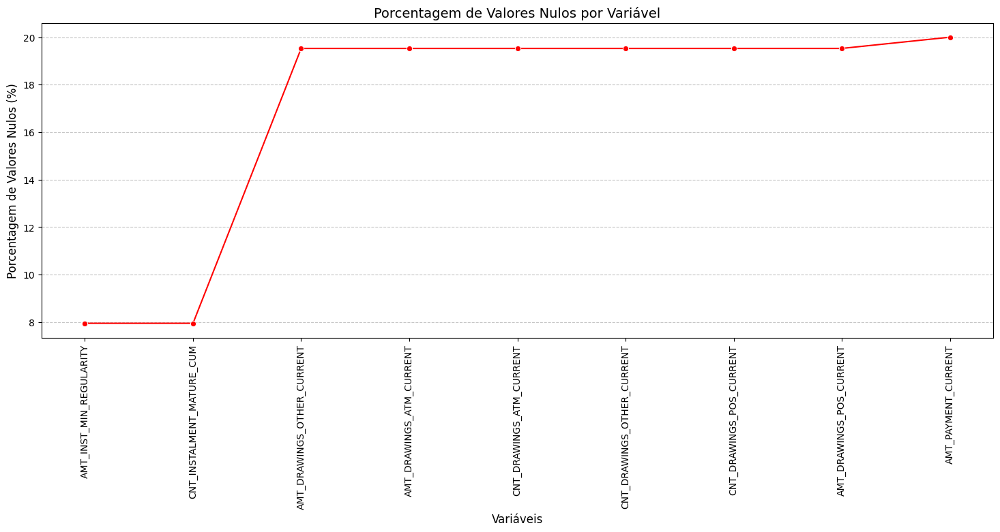

AMT_INST_MIN_REGULARITY        7.948208
CNT_INSTALMENT_MATURE_CUM      7.948208
AMT_DRAWINGS_OTHER_CURRENT    19.524872
AMT_DRAWINGS_ATM_CURRENT      19.524872
CNT_DRAWINGS_ATM_CURRENT      19.524872
CNT_DRAWINGS_OTHER_CURRENT    19.524872
CNT_DRAWINGS_POS_CURRENT      19.524872
AMT_DRAWINGS_POS_CURRENT      19.524872
AMT_PAYMENT_CURRENT           19.998063
dtype: float64

In [206]:
plot_missing_values(credit_card_bal)

### Análise de variáveis categóricas

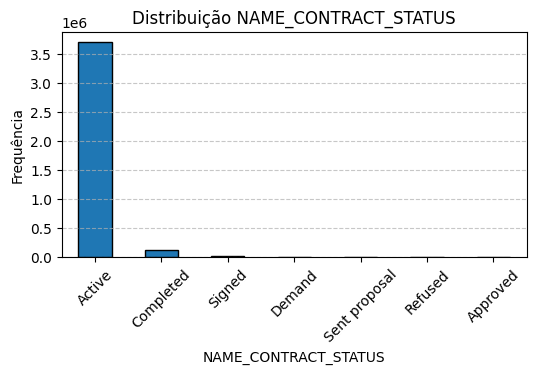

In [207]:
subplots_cat_vars(credit_card_bal)

Mesma variável que tem no dataset POS_CASH_bal

### Análise de variáveis numéricas

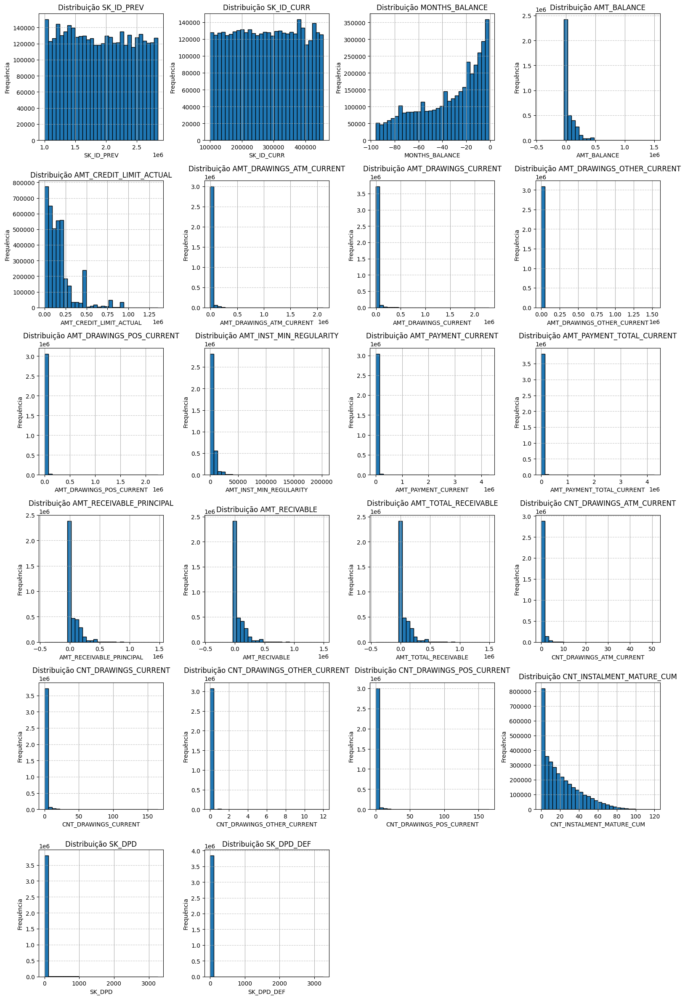

In [208]:
subplots_numeric_vars(credit_card_bal)

In [209]:
(credit_card_bal['SK_DPD'].value_counts(normalize=True)*100).round(2)

SK_DPD
0       96.01
1        2.35
8        0.07
32       0.06
7        0.05
62       0.04
31       0.03
366      0.02
93       0.02
18       0.02
154      0.02
305      0.02
213      0.02
1097     0.02
397      0.02
427      0.02
123      0.02
274      0.01
732      0.01
335      0.01
5        0.01
458      0.01
29       0.01
152      0.01
793      0.01
215      0.01
944      0.01
244      0.01
519      0.01
1036     0.01
1462     0.01
336      0.01
185      0.01
1158     0.01
182      0.01
701      0.01
28       0.01
1005     0.01
1128     0.01
1066     0.01
60       0.01
762      0.01
488      0.01
1309     0.01
671      0.01
121      0.01
246      0.01
731      0.01
124      0.01
640      0.01
885      0.01
763      0.01
91       0.01
824      0.01
883      0.01
1189     0.01
63       0.01
1401     0.01
670      0.01
578      0.01
92       0.01
609      0.01
183      0.01
1370     0.01
975      0.01
396      0.01
579      0.01
489      0.01
1250     0.01
428      0.01
913      0.01

In [210]:
(credit_card_bal['SK_DPD_DEF'].value_counts(normalize=True)*100).round(2)

SK_DPD_DEF
0       97.67
1        2.16
8        0.05
7        0.03
32       0.01
5        0.01
31       0.01
18       0.01
12       0.00
62       0.00
29       0.00
6        0.00
11       0.00
19       0.00
16       0.00
1007     0.00
519      0.00
17       0.00
28       0.00
641      0.00
93       0.00
9        0.00
30       0.00
1217     0.00
60       0.00
63       0.00
123      0.00
154      0.00
366      0.00
38       0.00
397      0.00
548      0.00
1462     0.00
1250     0.00
61       0.00
458      0.00
124      0.00
1097     0.00
427      0.00
185      0.00
1523     0.00
488      0.00
99       0.00
215      0.00
10       0.00
336      0.00
130      0.00
49       0.00
732      0.00
1827     0.00
69       0.00
1615     0.00
213      0.00
1584     0.00
1554     0.00
92       0.00
1858     0.00
489      0.00
274      0.00
793      0.00
1431     0.00
246      0.00
189      0.00
244      0.00
161      0.00
792      0.00
428      0.00
550      0.00
305      0.00
151      0.00
59       

In [211]:
(credit_card_bal['CNT_DRAWINGS_OTHER_CURRENT'].value_counts(normalize=True)*100).round(2)

CNT_DRAWINGS_OTHER_CURRENT
0.0     99.59
1.0      0.37
2.0      0.03
3.0      0.01
4.0      0.00
5.0      0.00
6.0      0.00
7.0      0.00
8.0      0.00
10.0     0.00
12.0     0.00
Name: proportion, dtype: float64

In [212]:
(credit_card_bal['CNT_DRAWINGS_POS_CURRENT'].value_counts(normalize=True)*100).round(2)

CNT_DRAWINGS_POS_CURRENT
0.0      91.43
1.0       2.34
2.0       1.33
3.0       0.88
4.0       0.66
5.0       0.49
6.0       0.39
7.0       0.32
8.0       0.26
9.0       0.21
10.0      0.18
11.0      0.16
12.0      0.13
13.0      0.12
14.0      0.10
15.0      0.10
16.0      0.08
17.0      0.07
18.0      0.06
19.0      0.06
20.0      0.05
21.0      0.05
22.0      0.04
23.0      0.04
24.0      0.03
25.0      0.03
26.0      0.03
27.0      0.03
29.0      0.02
28.0      0.02
30.0      0.02
31.0      0.02
32.0      0.02
33.0      0.02
34.0      0.01
37.0      0.01
35.0      0.01
36.0      0.01
38.0      0.01
39.0      0.01
40.0      0.01
41.0      0.01
42.0      0.01
43.0      0.01
44.0      0.01
45.0      0.01
47.0      0.01
48.0      0.01
46.0      0.00
49.0      0.00
50.0      0.00
51.0      0.00
52.0      0.00
53.0      0.00
54.0      0.00
56.0      0.00
60.0      0.00
57.0      0.00
59.0      0.00
63.0      0.00
61.0      0.00
55.0      0.00
58.0      0.00
62.0      0.00
67.0      0.00


In [213]:
(credit_card_bal['AMT_DRAWINGS_POS_CURRENT'].value_counts(normalize=True)*100).round(2)

AMT_DRAWINGS_POS_CURRENT
0.000000        91.43
450.000000       0.04
900.000000       0.03
2250.000000      0.03
4500.000000      0.03
                ...  
64282.500000     0.00
2990.564941      0.00
65295.000000     0.00
5566.095215      0.00
6918.615234      0.00
Name: proportion, Length: 168748, dtype: float64

In [214]:
(credit_card_bal['CNT_DRAWINGS_CURRENT'].value_counts(normalize=True)*100).round(2)

CNT_DRAWINGS_CURRENT
0      84.11
1       6.02
2       3.04
3       1.70
4       1.13
5       0.75
6       0.54
7       0.41
8       0.32
9       0.25
10      0.21
11      0.17
12      0.15
13      0.13
14      0.11
15      0.10
16      0.08
17      0.07
18      0.06
19      0.06
20      0.05
21      0.05
22      0.04
23      0.04
24      0.03
25      0.03
26      0.03
27      0.03
29      0.02
28      0.02
30      0.02
31      0.02
32      0.02
33      0.02
34      0.01
35      0.01
36      0.01
37      0.01
38      0.01
39      0.01
41      0.01
40      0.01
42      0.01
43      0.01
44      0.01
45      0.01
46      0.00
49      0.00
47      0.00
48      0.00
50      0.00
51      0.00
53      0.00
52      0.00
56      0.00
54      0.00
57      0.00
60      0.00
55      0.00
59      0.00
58      0.00
61      0.00
63      0.00
62      0.00
67      0.00
68      0.00
64      0.00
66      0.00
70      0.00
65      0.00
69      0.00
71      0.00
74      0.00
76      0.00
78      0.00
79  

MONTHS_BALANCE também é a mesma variável?

## Dataset installments_payments

In [215]:
install_pay_df.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.359863,6948.359863
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525024,1716.525024
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000000,25425.000000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130859,24350.130859
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040039,2160.584961


In [216]:
install_pay_df['SK_ID_CURR'].value_counts()

SK_ID_CURR
145728    372
296205    350
453103    347
189699    344
186851    337
         ... 
215358      1
293010      1
412442      1
436772      1
441700      1
Name: count, Length: 339587, dtype: int64

In [217]:
install_pay_df['SK_ID_PREV'].value_counts()

SK_ID_PREV
2360056    293
2592574    279
1017477    248
1449382    243
1746731    236
          ... 
1719498      1
2238539      1
1869004      1
1289784      1
1864838      1
Name: count, Length: 997752, dtype: int64

In [218]:
install_pay_df.dtypes

SK_ID_PREV                  int32
SK_ID_CURR                  int32
NUM_INSTALMENT_VERSION    float32
NUM_INSTALMENT_NUMBER       int16
DAYS_INSTALMENT           float32
DAYS_ENTRY_PAYMENT        float32
AMT_INSTALMENT            float32
AMT_PAYMENT               float32
dtype: object

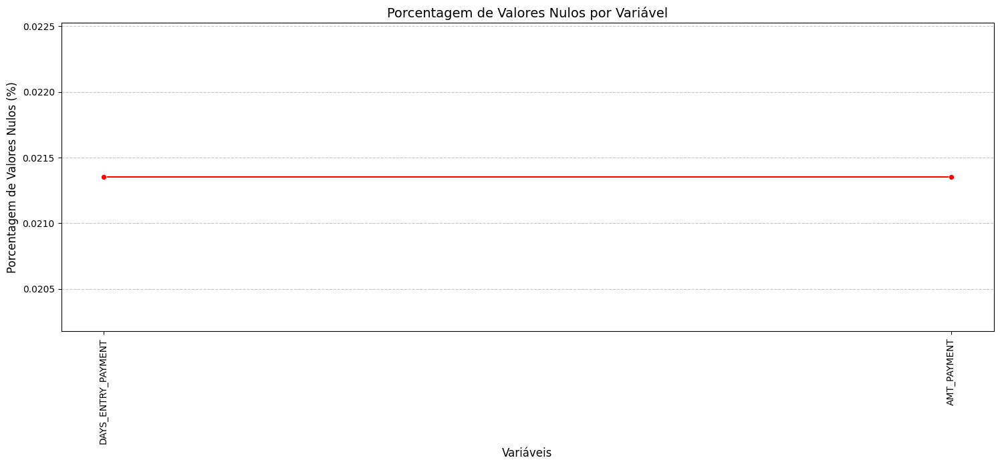

DAYS_ENTRY_PAYMENT    0.021352
AMT_PAYMENT           0.021352
dtype: float64

In [219]:
plot_missing_values(install_pay_df)

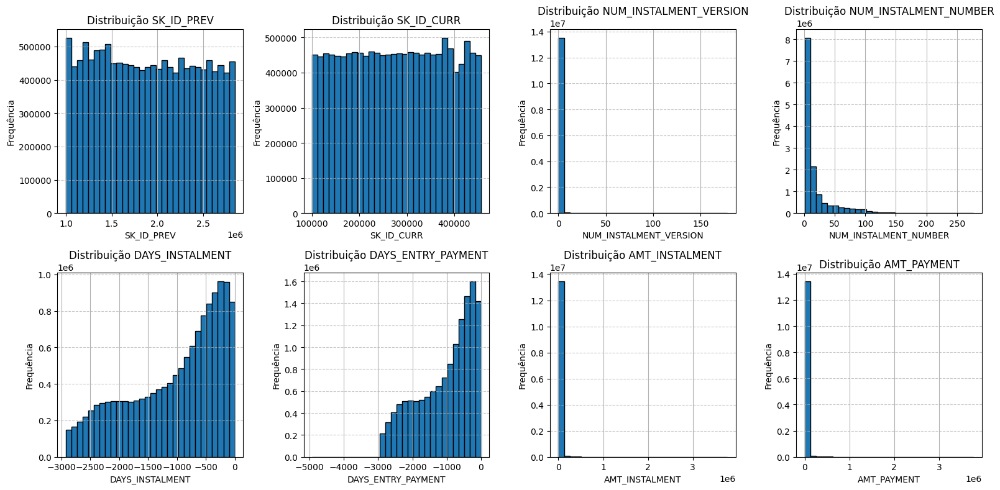

In [220]:
subplots_numeric_vars(install_pay_df)

In [221]:
install_pay_df[['DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT']]

,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT
0,-1180.0,-1187.0
1,-2156.0,-2156.0
2,-63.0,-63.0
3,-2418.0,-2426.0
4,-1383.0,-1366.0
...,...,...
13605396,-1624.0,NaN
13605397,-1539.0,NaN
13605398,-7.0,NaN
13605399,-1986.0,NaN


As variáveis **DAYS_INSTALMENT** e **DAYS_ENTRY_PAYMENT** parecem ser interessantes para o modelo.

Uma abordagem para utilzar essas informações seria criar uma coluna **PAYMENT_DELAY**, que basicamente seria a subtração de **DAYS_ENTRY_PAYMENT** com  **DAYS_INSTALMENT**. Essa feature representaria o atraso em dias do pagamento da parcela. Porém, o problema é que temos valores nulos na coluna **DAYS_ENTRY_PAYMENT**, e basicamente não tem como inputar média, ou valores neutros como 0, ou assumir que o pagamento foi realizado no dia.

In [222]:
install_pay_df[['AMT_INSTALMENT', 'AMT_PAYMENT']]

,AMT_INSTALMENT,AMT_PAYMENT
0,6948.359863,6948.359863
1,1716.525024,1716.525024
2,25425.000000,25425.000000
3,24350.130859,24350.130859
4,2165.040039,2160.584961
...,...,...
13605396,67.500000,NaN
13605397,67.500000,NaN
13605398,43737.433594,NaN
13605399,67.500000,NaN


Uma situação parecida acontece com a variável **AMT_PAYMENT**, que representa o quanto o cliente pagou da parcela e que também possui valores nulos.

# Modelagem

## Manipulando datasets que serão utilizados

Após todo o desenvolvimento da EDA, os datasets que eu resolvi utilizar são:
- **application_train**
- **bureau**
- **bureau_balance**
- **POS_CASH_balance**
- **instalments_payments**

Através da análise desenvolvida, eu julguei serem os datasets com maior quantidade de informações importantes para a análise de risco de inadimplência. Além disso, os datasets **previous_application** e **credit_card_balance** estavam mais complexos de se analisar e obter informações relevantes através de suas variáveis.

### Agrupamento do dataset bureau_balance

Antes de agregar informações no dataset **bureau**, é preciso agregar informações no dataset **bureau_balance**. 

Isso porque a chave **SK_ID_BUREAU** é única no dataset **bureau**, e se agruparmos por **SK_ID_CURR** (id do empréstimo) iremos perder muitas informações sobre os créditos relacionados. Portanto, agrupando primeiro pela chave **SK_ID_BUREAU** no dataset **bureau_balance**, conseguimos extrair o melhor dos dados nos dois datasets.

In [223]:
bureau_bal_df_handled

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS_BUREAU
0,5715448,0,Closed
1,5715448,-1,Closed
2,5715448,-2,Closed
3,5715448,-3,Closed
4,5715448,-4,Closed
...,...,...,...
27299920,5041336,-47,Unknown
27299921,5041336,-48,Unknown
27299922,5041336,-49,Unknown
27299923,5041336,-50,Unknown


In [224]:
bureau_bal_df_handled[bureau_bal_df_handled['SK_ID_BUREAU'] == 5715448]

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS_BUREAU
0,5715448,0,Closed
1,5715448,-1,Closed
2,5715448,-2,Closed
3,5715448,-3,Closed
4,5715448,-4,Closed
5,5715448,-5,Closed
6,5715448,-6,Closed
7,5715448,-7,Closed
8,5715448,-8,Closed
9,5715448,-9,No DPD


In [225]:
bureau_bal_agg = bureau_bal_df_handled.copy()

Podemos agregar as aplicações a fim de obter as seguintes informações:
- Primeiro status do crédito
- Último status do crédito
- Quantidade de meses registradas para cada crédito

In [226]:
bureau_bal_agg = bureau_bal_agg.groupby('SK_ID_BUREAU').agg({
    'STATUS_BUREAU': ['min', 'max'],
    'MONTHS_BALANCE': 'count'
}).reset_index()

In [227]:
bureau_bal_agg

SK_ID_BUREAU STATUS_BUREAU          MONTHS_BALANCE
                              min      max          count
0           5001709        Closed  Unknown             97
1           5001710        Closed  Unknown             83
2           5001711        No DPD  Unknown              4
3           5001712        Closed   No DPD             19
4           5001713       Unknown  Unknown             22
...             ...           ...      ...            ...
817390      6842884        Closed  Unknown             48
817391      6842885      High DPD   No DPD             24
817392      6842886        Closed   No DPD             33
817393      6842887        Closed   No DPD             37
817394      6842888        Closed   No DPD             62

[817395 rows x 4 columns]

In [228]:
#renomeando colunas
bureau_bal_agg.columns = ['SK_ID_BUREAU', 'FIRST_STATUS', 'LAST_STATUS', 'MONTHS_BALANCE_COUNT']

In [229]:
bureau_bal_agg

,SK_ID_BUREAU,FIRST_STATUS,LAST_STATUS,MONTHS_BALANCE_COUNT
0,5001709,Closed,Unknown,97
1,5001710,Closed,Unknown,83
2,5001711,No DPD,Unknown,4
3,5001712,Closed,No DPD,19
4,5001713,Unknown,Unknown,22
...,...,...,...,...
817390,6842884,Closed,Unknown,48
817391,6842885,High DPD,No DPD,24
817392,6842886,Closed,No DPD,33
817393,6842887,Closed,No DPD,37


In [230]:
bureau_bal_agg.duplicated().sum()

np.int64(0)

#### Merge com bureau

Para preservar as informações, é melhor fazer o merge com o dataset bureau, e agrupá-lo depois

In [231]:
bureau_handled_copy = bureau_df_handled.copy()

In [232]:
bureau_merge = pd.merge(bureau_handled_copy, bureau_bal_agg, on='SK_ID_BUREAU', how='left')

Left merge pois queremos **manter todas as informações do dataset bureau e agregar com o bureau_balance**

### Agrupamento do dataset bureau

Como evidenciado pela análise exploratória, para cada empréstimo tem-se vários créditos que o cliente teve no birô de crédito antes da aplicação do empréstimo atual.

Portanto, uma forma eficaz de utilizar as informações desse dataset, é fazer um agrupamento dos créditos para cada **SK_ID_CURR**, de forma a condensar essas informações em estatísticas descritivas.

In [233]:
bureau_merge.sort_values(by='SK_ID_CURR')

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,DAYS_CREDIT_UPDATE,CREDIT_STATUS,CREDIT_TYPE_GROUP,FIRST_STATUS,LAST_STATUS,MONTHS_BALANCE_COUNT
248485,100001,5896631,-909,-179.0,-877.0,279720.0,0.00000,-155,Closed,Consumer credit,Closed,No DPD,30.0
248484,100001,5896630,-857,-492.0,-553.0,112500.0,0.00000,-155,Closed,Consumer credit,Closed,Unknown,29.0
248490,100001,5896636,-320,411.0,NaN,168345.0,110281.50000,-10,Active,Consumer credit,No DPD,No DPD,11.0
248487,100001,5896633,-1572,-1329.0,-1328.0,85500.0,0.00000,-155,Closed,Consumer credit,Closed,Unknown,52.0
248486,100001,5896632,-879,-514.0,-544.0,91620.0,0.00000,-155,Closed,Consumer credit,Closed,Unknown,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1010005,456255,5126329,-573,523.0,NaN,553500.0,324171.00000,-19,Active,Consumer credit,Closed,Unknown,19.0
1010011,456255,5126335,-1512,315.0,-781.0,900000.0,NaN,-781,Closed,Consumer credit,Closed,Unknown,33.0
1010010,456255,5126334,-451,279.0,NaN,450000.0,191005.46875,-55,Active,Consumer credit,Closed,Unknown,15.0
1010004,456255,5126328,-970,-621.0,-712.0,27472.5,0.00000,-700,Closed,Consumer credit,Closed,Unknown,32.0


In [234]:
bureau_merge[bureau_merge['SK_ID_CURR'] == 100001]

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,DAYS_CREDIT_UPDATE,CREDIT_STATUS,CREDIT_TYPE_GROUP,FIRST_STATUS,LAST_STATUS,MONTHS_BALANCE_COUNT
248484,100001,5896630,-857,-492.0,-553.0,112500.0,0.0,-155,Closed,Consumer credit,Closed,Unknown,29.0
248485,100001,5896631,-909,-179.0,-877.0,279720.0,0.0,-155,Closed,Consumer credit,Closed,No DPD,30.0
248486,100001,5896632,-879,-514.0,-544.0,91620.0,0.0,-155,Closed,Consumer credit,Closed,Unknown,29.0
248487,100001,5896633,-1572,-1329.0,-1328.0,85500.0,0.0,-155,Closed,Consumer credit,Closed,Unknown,52.0
248488,100001,5896634,-559,902.0,NaN,337680.0,113166.0,-6,Active,Consumer credit,Low DPD,Unknown,19.0
248489,100001,5896635,-49,1778.0,NaN,378000.0,373239.0,-16,Active,Consumer credit,No DPD,Unknown,2.0
248490,100001,5896636,-320,411.0,NaN,168345.0,110281.5,-10,Active,Consumer credit,No DPD,No DPD,11.0


In [235]:
bureau_merge.dtypes

SK_ID_CURR                int32
SK_ID_BUREAU              int32
DAYS_CREDIT               int16
DAYS_CREDIT_ENDDATE     float32
DAYS_ENDDATE_FACT       float32
AMT_CREDIT_SUM          float32
AMT_CREDIT_SUM_DEBT     float32
DAYS_CREDIT_UPDATE        int32
CREDIT_STATUS            object
CREDIT_TYPE_GROUP        object
FIRST_STATUS             object
LAST_STATUS              object
MONTHS_BALANCE_COUNT    float64
dtype: object

Podemos agregar os créditos a fim de obter as seguintes informações sobre o empréstimo:
- Valor total e médio do crédito atual (**AMT_CREDIT_SUM**)
- Valor total e médio do atual valor devido (**AMT_CREDIT_SUM_DEBT**)
- Valor mínimo, máximo e médio dos dias  desde a concessão do crédito (**DAYS_CREDIT**)
- Valor mínimo, máximo e médio da duração restante do crédito (**DAYS_CREDIT_ENDDATE**)
- Valor mínimo, máximo e médio dos dias desde que o crédito foi encerrado (**DAYS_ENDDATE_FACT**)
- Valor mínimo e máximo da última atualização do crédito (**DAYS_CREDIT_UPDATE**)
- Quantidade total de meses registrados no birô. Soma -> (**MONTHS_BALANCE_COUNT**)
- Status de crédito mais frequente (**CREDIT_STATUS**)

In [236]:
bureau_agg = bureau_merge.groupby('SK_ID_CURR').agg({
    'AMT_CREDIT_SUM': ['sum', 'mean'],
    'AMT_CREDIT_SUM_DEBT': ['sum', 'mean'],
    
    'DAYS_CREDIT': ['mean', 'min', 'max'],  
    'DAYS_CREDIT_ENDDATE': ['mean', 'min', 'max'],  
    'DAYS_ENDDATE_FACT': ['mean', 'min', 'max'], 
    'DAYS_CREDIT_UPDATE': ['min', 'max'],  
    
    'MONTHS_BALANCE_COUNT': ['sum'],  
    'CREDIT_STATUS': lambda x: x.mode()[0] if not x.mode().empty else np.nan,  
    'FIRST_STATUS': lambda x: x.iloc[0], 
    'LAST_STATUS': lambda x: x.iloc[-1] 
}).reset_index()

In [237]:
bureau_agg

SK_ID_CURR AMT_CREDIT_SUM               AMT_CREDIT_SUM_DEBT  \
                             sum          mean                 sum   
0          100001   1.453365e+06  2.076236e+05            596686.5   
1          100002   8.650556e+05  1.081319e+05            245781.0   
2          100003   1.017400e+06  2.543501e+05                 0.0   
3          100004   1.890378e+05  9.451890e+04                 0.0   
4          100005   6.571260e+05  2.190420e+05            568408.5   
...           ...            ...           ...                 ...   
305806     456249   3.693858e+06  2.841430e+05            163071.0   
305807     456250   3.086460e+06  1.028820e+06           2232040.0   
305808     456253   3.960000e+06  9.900000e+05           1795833.0   
305809     456254   4.500000e+04  4.500000e+04                 0.0   
305810     456255   3.801920e+06  3.456290e+05           1534913.0   

                       DAYS_CREDIT             DAYS_CREDIT_ENDDATE          \
                 mean         mean   min   max                mean     min   
0        85240.929688  -735.000000 -1572   -49           82.428574 -1329.0   
1        49156.199219  -874.000000 -1437  -103         -349.000000 -1072.0   
2            0.000000 -1400.750000 -2586  -606         -544.500000 -2434.0   
3            0.000000  -867.000000 -1326  -408         -488.500000  -595.0   
4       189469.500000  -190.666667  -373   -62          439.333344  -128.0   
...               ...          ...   ...   ...                 ...     ...   
305806   16307.099609 -1667.076923 -2713  -483        -1232.333374 -2499.0   
305807  744013.312500  -862.000000 -1002  -760         1288.333374  -272.0   
305808  448958.250000  -867.500000  -919  -713          280.500000  -189.0   
305809       0.000000 -1104.000000 -1104 -1104         -859.000000  -859.0   
305810  191864.125000 -1089.454545 -2337  -363         3231.272705 -1243.0   

                DAYS_ENDDATE_FACT                DAYS_CREDIT_UPDATE       \
            max              mean     min    max                min  max   
0        1778.0       -825.500000 -1328.0 -544.0               -155   -6   
1         780.0       -697.500000 -1185.0  -36.0              -1185   -7   
2        1216.0      -1097.333374 -2131.0 -540.0              -2131  -43   
3        -382.0       -532.500000  -683.0 -382.0               -682 -382   
4        1324.0       -123.000000  -123.0 -123.0               -121  -11   
...         ...               ...     ...    ...                ...  ...   
305806   1363.0      -1364.750000 -2525.0 -291.0              -2498  -12   
305807   2340.0       -760.000000  -760.0 -760.0               -127  -23   
305808   1113.0       -794.000000  -794.0 -794.0               -701   -5   
305809   -859.0       -859.000000  -859.0 -859.0               -401 -401   
305810  27320.0       -968.333313 -1621.0 -712.0              -1621   -8   

       MONTHS_BALANCE_COUNT CREDIT_STATUS FIRST_STATUS LAST_STATUS  
                        sum      <lambda>     <lambda>    <lambda>  
0                     172.0        Closed       Closed      No DPD  
1                     110.0        Closed       Closed     Unknown  
2                       0.0        Closed          NaN         NaN  
3                       0.0        Closed          NaN         NaN  
4                      21.0        Active       Closed     Unknown  
...                     ...           ...          ...         ...  
305806                  0.0        Closed          NaN         NaN  
305807                 87.0        Active       Closed     Unknown  
305808                117.0        Active       Closed     Unknown  
305809                 37.0        Closed       Closed      No DPD  
305810                293.0        Closed       Closed     Unknown  

[305811 rows x 20 columns]

In [238]:
print(bureau_agg.columns)

MultiIndex([(          'SK_ID_CURR',         ''),
            (      'AMT_CREDIT_SUM',      'sum'),
            (      'AMT_CREDIT_SUM',     'mean'),
            ( 'AMT_CREDIT_SUM_DEBT',      'sum'),
            ( 'AMT_CREDIT_SUM_DEBT',     'mean'),
            (         'DAYS_CREDIT',     'mean'),
            (         'DAYS_CREDIT',      'min'),
            (         'DAYS_CREDIT',      'max'),
            ( 'DAYS_CREDIT_ENDDATE',     'mean'),
            ( 'DAYS_CREDIT_ENDDATE',      'min'),
            ( 'DAYS_CREDIT_ENDDATE',      'max'),
            (   'DAYS_ENDDATE_FACT',     'mean'),
            (   'DAYS_ENDDATE_FACT',      'min'),
            (   'DAYS_ENDDATE_FACT',      'max'),
            (  'DAYS_CREDIT_UPDATE',      'min'),
            (  'DAYS_CREDIT_UPDATE',      'max'),
            ('MONTHS_BALANCE_COUNT',      'sum'),
            (       'CREDIT_STATUS', '<lambda>'),
            (        'FIRST_STATUS', '<lambda>'),
            (         'LAST_STATUS', '<lambda>')],

In [239]:
bureau_agg.columns = ['_'.join(col).strip() if col[1] else col[0] for col in bureau_agg.columns]

In [240]:
print(bureau_agg.columns)

Index(['SK_ID_CURR', 'AMT_CREDIT_SUM_sum', 'AMT_CREDIT_SUM_mean',
       'AMT_CREDIT_SUM_DEBT_sum', 'AMT_CREDIT_SUM_DEBT_mean',
       'DAYS_CREDIT_mean', 'DAYS_CREDIT_min', 'DAYS_CREDIT_max',
       'DAYS_CREDIT_ENDDATE_mean', 'DAYS_CREDIT_ENDDATE_min',
       'DAYS_CREDIT_ENDDATE_max', 'DAYS_ENDDATE_FACT_mean',
       'DAYS_ENDDATE_FACT_min', 'DAYS_ENDDATE_FACT_max',
       'DAYS_CREDIT_UPDATE_min', 'DAYS_CREDIT_UPDATE_max',
       'MONTHS_BALANCE_COUNT_sum', 'CREDIT_STATUS_<lambda>',
       'FIRST_STATUS_<lambda>', 'LAST_STATUS_<lambda>'],
      dtype='object')


In [241]:
bureau_agg = bureau_agg.rename(columns={
    'SK_ID_CURR': 'SK_ID_CURR',
    'AMT_CREDIT_SUM_sum': 'SUM_AMT_CREDIT_SUM',
    'AMT_CREDIT_SUM_mean': 'AVG_AMT_CREDIT_SUM',
    'AMT_CREDIT_SUM_DEBT_sum': 'SUM_AMT_CREDIT_SUM_DEBT',
    'AMT_CREDIT_SUM_DEBT_mean': 'AVG_AMT_CREDIT_SUM_DEBT',
    'DAYS_CREDIT_mean': 'AVG_DAYS_CREDIT',
    'DAYS_CREDIT_min': 'MIN_DAYS_CREDIT',
    'DAYS_CREDIT_max': 'MAX_DAYS_CREDIT',
    'DAYS_CREDIT_ENDDATE_mean': 'AVG_DAYS_CREDIT_ENDDATE',
    'DAYS_CREDIT_ENDDATE_min': 'MIN_DAYS_CREDIT_ENDDATE',
    'DAYS_CREDIT_ENDDATE_max': 'MAX_CREDIT_ENDDATE',
    'DAYS_ENDDATE_FACT_mean': 'AVG_DAYS_ENDDATE_FACT',
    'DAYS_ENDDATE_FACT_min': 'MIN_DAYS_ENDDATE_FACT',
    'DAYS_ENDDATE_FACT_max': 'MAX_DAYS_ENDDATE_FACT',
    'DAYS_CREDIT_UPDATE_min': 'MIN_DAYS_CREDIT_UPDATE',
    'DAYS_CREDIT_UPDATE_max': 'MAX_DAYS_CREDIT_UPDATE',
    'MONTHS_BALANCE_COUNT_sum': 'SUM_MONTHS_BALANCE_COUNT',
    'CREDIT_STATUS_<lambda>': 'MODE_CREDIT_STATUS', 
    'FIRST_STATUS_<lambda>': 'FIRST_STATUS',
    'LAST_STATUS_<lambda>': 'LAST_STATUS'
})

In [242]:
bureau_agg

,SK_ID_CURR,SUM_AMT_CREDIT_SUM,AVG_AMT_CREDIT_SUM,SUM_AMT_CREDIT_SUM_DEBT,AVG_AMT_CREDIT_SUM_DEBT,AVG_DAYS_CREDIT,MIN_DAYS_CREDIT,MAX_DAYS_CREDIT,AVG_DAYS_CREDIT_ENDDATE,MIN_DAYS_CREDIT_ENDDATE,MAX_CREDIT_ENDDATE,AVG_DAYS_ENDDATE_FACT,MIN_DAYS_ENDDATE_FACT,MAX_DAYS_ENDDATE_FACT,MIN_DAYS_CREDIT_UPDATE,MAX_DAYS_CREDIT_UPDATE,SUM_MONTHS_BALANCE_COUNT,MODE_CREDIT_STATUS,FIRST_STATUS,LAST_STATUS
0,100001,1.453365e+06,2.076236e+05,596686.5,85240.929688,-735.000000,-1572,-49,82.428574,-1329.0,1778.0,-825.500000,-1328.0,-544.0,-155,-6,172.0,Closed,Closed,No DPD
1,100002,8.650556e+05,1.081319e+05,245781.0,49156.199219,-874.000000,-1437,-103,-349.000000,-1072.0,780.0,-697.500000,-1185.0,-36.0,-1185,-7,110.0,Closed,Closed,Unknown
2,100003,1.017400e+06,2.543501e+05,0.0,0.000000,-1400.750000,-2586,-606,-544.500000,-2434.0,1216.0,-1097.333374,-2131.0,-540.0,-2131,-43,0.0,Closed,NaN,NaN
3,100004,1.890378e+05,9.451890e+04,0.0,0.000000,-867.000000,-1326,-408,-488.500000,-595.0,-382.0,-532.500000,-683.0,-382.0,-682,-382,0.0,Closed,NaN,NaN
4,100005,6.571260e+05,2.190420e+05,568408.5,189469.500000,-190.666667,-373,-62,439.333344,-128.0,1324.0,-123.000000,-123.0,-123.0,-121,-11,21.0,Active,Closed,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305806,456249,3.693858e+06,2.841430e+05,163071.0,16307.099609,-1667.076923,-2713,-483,-1232.333374,-2499.0,1363.0,-1364.750000,-2525.0,-291.0,-2498,-12,0.0,Closed,NaN,NaN
305807,456250,3.086460e+06,1.028820e+06,2232040.0,744013.312500,-862.000000,-1002,-760,1288.333374,-272.0,2340.0,-760.000000,-760.0,-760.0,-127,-23,87.0,Active,Closed,Unknown
305808,456253,3.960000e+06,9.900000e+05,1795833.0,448958.250000,-867.500000,-919,-713,280.500000,-189.0,1113.0,-794.000000,-794.0,-794.0,-701,-5,117.0,Active,Closed,Unknown
305809,456254,4.500000e+04,4.500000e+04,0.0,0.000000,-1104.000000,-1104,-1104,-859.000000,-859.0,-859.0,-859.000000,-859.0,-859.0,-401,-401,37.0,Closed,Closed,No DPD


In [243]:
bureau_agg.isnull().sum()

SK_ID_CURR                       0
SUM_AMT_CREDIT_SUM               0
AVG_AMT_CREDIT_SUM               2
SUM_AMT_CREDIT_SUM_DEBT          0
AVG_AMT_CREDIT_SUM_DEBT       8372
AVG_DAYS_CREDIT                  0
MIN_DAYS_CREDIT                  0
MAX_DAYS_CREDIT                  0
AVG_DAYS_CREDIT_ENDDATE       2585
MIN_DAYS_CREDIT_ENDDATE       2585
MAX_CREDIT_ENDDATE            2585
AVG_DAYS_ENDDATE_FACT        37656
MIN_DAYS_ENDDATE_FACT        37656
MAX_DAYS_ENDDATE_FACT        37656
MIN_DAYS_CREDIT_UPDATE           0
MAX_DAYS_CREDIT_UPDATE           0
SUM_MONTHS_BALANCE_COUNT         0
MODE_CREDIT_STATUS               0
FIRST_STATUS                171329
LAST_STATUS                 171334
dtype: int64

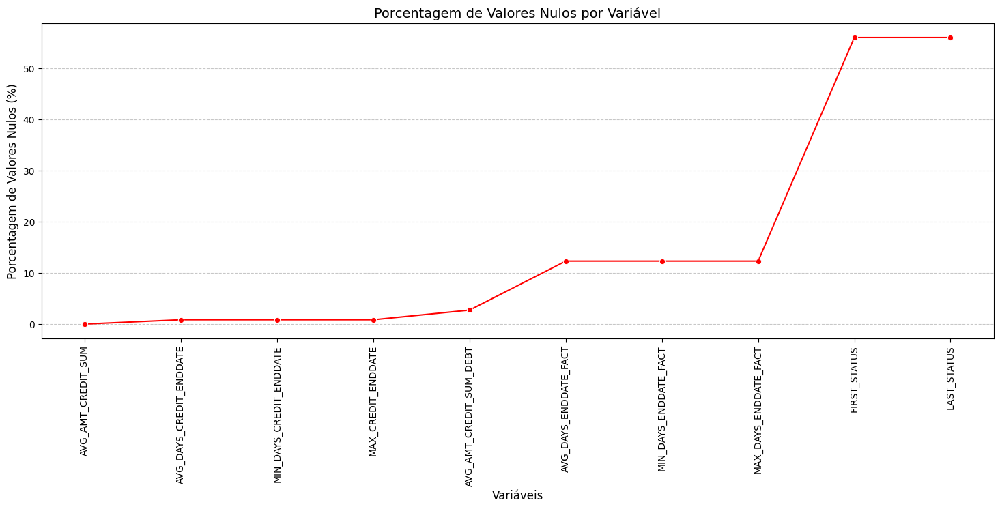

AVG_AMT_CREDIT_SUM          0.000654
AVG_DAYS_CREDIT_ENDDATE     0.845293
MIN_DAYS_CREDIT_ENDDATE     0.845293
MAX_CREDIT_ENDDATE          0.845293
AVG_AMT_CREDIT_SUM_DEBT     2.737639
AVG_DAYS_ENDDATE_FACT      12.313488
MIN_DAYS_ENDDATE_FACT      12.313488
MAX_DAYS_ENDDATE_FACT      12.313488
FIRST_STATUS               56.024473
LAST_STATUS                56.026108
dtype: float64

In [244]:
plot_missing_values(bureau_agg)

### Agrupamento do POS_CASH_balance

In [245]:
pos_cash_bal_df_handled[pos_cash_bal_df_handled['SK_ID_PREV'] == 1803195].sort_values(by='MONTHS_BALANCE', ascending=False)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,CONTRACT_STATUS
1660128,1803195,182943,-2,48.0,15.0,Active
1991852,1803195,182943,-3,48.0,16.0,Active
1120907,1803195,182943,-4,48.0,17.0,Active
3235792,1803195,182943,-5,48.0,18.0,Active
4954776,1803195,182943,-6,48.0,19.0,Active
3735752,1803195,182943,-7,48.0,20.0,Active
925513,1803195,182943,-8,48.0,21.0,Active
4617147,1803195,182943,-9,48.0,22.0,Active
1996667,1803195,182943,-10,48.0,23.0,Active
1843615,1803195,182943,-11,48.0,25.0,Active


In [246]:
pos_cash_bal_agg = pos_cash_bal_df_handled.copy()

Ordenando o dataset

In [247]:
pos_cash_bal_agg = pos_cash_bal_agg.sort_values(by=['SK_ID_PREV', 'MONTHS_BALANCE'], ascending=[True, False]).reset_index(drop=True)

In [248]:
pos_cash_bal_agg

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,CONTRACT_STATUS
0,1000001,158271,-8,2.0,0.0,Completed
1,1000001,158271,-9,12.0,11.0,Active
2,1000001,158271,-10,12.0,12.0,Active
3,1000002,101962,-50,4.0,0.0,Completed
4,1000002,101962,-51,6.0,1.0,Active
...,...,...,...,...,...,...
10001353,2843499,314148,-36,60.0,56.0,Active
10001354,2843499,314148,-37,60.0,57.0,Active
10001355,2843499,314148,-38,60.0,58.0,Active
10001356,2843499,314148,-39,60.0,59.0,Active


In [249]:
pos_cash_bal_agg[pos_cash_bal_agg['SK_ID_PREV'] == 1000001]

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,CONTRACT_STATUS
0,1000001,158271,-8,2.0,0.0,Completed
1,1000001,158271,-9,12.0,11.0,Active
2,1000001,158271,-10,12.0,12.0,Active


Agregando o dataset POS_CASH_balance eu busco obter:
- Quantidade de meses da aplicação anterior (**MONTHS_BALANCE**)
- Quantidade de parcelas (**CNT_INSTALMENT**)
- Quantidade de parcelas que faltam pagar, definido pela última parcela (**CNT_INSTALMENT_FUTURE**)
- Status do contrato, definido pela última parcela (**CONTRACT_STATUS**)

Essas informações foram possíveis de se obter graças a ordenação do dataset por **SK_ID_PREV** e **MONTHS_BALANCE**

In [250]:
pos_cash_bal_agg = pos_cash_bal_agg.groupby('SK_ID_PREV').agg({
    'MONTHS_BALANCE': lambda x: x.max() - x.min() + 1,
    'CNT_INSTALMENT': 'max',
    'CNT_INSTALMENT_FUTURE': lambda x: x.iloc[0], #última parcela
    'CONTRACT_STATUS': lambda x: x.iloc[0] #última parcela
}).reset_index()

In [251]:
pos_cash_bal_agg

,SK_ID_PREV,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,CONTRACT_STATUS
0,1000001,3,12.0,0.0,Completed
1,1000002,5,6.0,0.0,Completed
2,1000003,4,12.0,9.0,Active
3,1000004,8,10.0,0.0,Completed
4,1000005,11,10.0,0.0,Completed
...,...,...,...,...,...
936320,2843494,3,48.0,0.0,Completed
936321,2843495,8,60.0,0.0,Completed
936322,2843497,21,24.0,4.0,Active
936323,2843498,7,36.0,0.0,Completed


In [252]:
#renomeando colunas para melhor entendimento
pos_cash_bal_agg = pos_cash_bal_agg.rename(columns={
    'MONTHS_BALANCE': 'COUNT_MONTHS_BALANCE_PREV_APP',
    'CNT_INSTALMENT': 'CNT_INSTALMENT_PREV_APP',
    'CNT_INSTALMENT_FUTURE': 'CNT_INSTALMENT_FUTURE_PREV_APP',
    'CONTRACT_STATUS': 'CONTRACT_STATUS_PREV_APP'
})

Com a agregação acima, acabamos perdendo a **chave SK_ID_CURR**, que vai nos auxiliar a fazer o merge com os outros datasets posteriormente. Então é necessário recuperá-la

In [253]:
pos_cash_bal_agg = pos_cash_bal_agg.merge(pos_cash_bal_df_handled[['SK_ID_PREV', 'SK_ID_CURR']].drop_duplicates(), on='SK_ID_PREV', how='left')

In [254]:
pos_cash_bal_agg.head()

,SK_ID_PREV,COUNT_MONTHS_BALANCE_PREV_APP,CNT_INSTALMENT_PREV_APP,CNT_INSTALMENT_FUTURE_PREV_APP,CONTRACT_STATUS_PREV_APP,SK_ID_CURR
0,1000001,3,12.0,0.0,Completed,158271
1,1000002,5,6.0,0.0,Completed,101962
2,1000003,4,12.0,9.0,Active,252457
3,1000004,8,10.0,0.0,Completed,260094
4,1000005,11,10.0,0.0,Completed,176456


In [255]:
cols = list(pos_cash_bal_agg.columns.values)
cols

['SK_ID_PREV',
 'COUNT_MONTHS_BALANCE_PREV_APP',
 'CNT_INSTALMENT_PREV_APP',
 'CNT_INSTALMENT_FUTURE_PREV_APP',
 'CONTRACT_STATUS_PREV_APP',
 'SK_ID_CURR']

In [256]:
#Mudando a ordem das colunas
pos_cash_bal_agg = pos_cash_bal_agg[['SK_ID_PREV', 'SK_ID_CURR', 'COUNT_MONTHS_BALANCE_PREV_APP', 'CNT_INSTALMENT_PREV_APP', 'CNT_INSTALMENT_FUTURE_PREV_APP', 'CONTRACT_STATUS_PREV_APP']]

In [257]:
pos_cash_bal_agg.head()

,SK_ID_PREV,SK_ID_CURR,COUNT_MONTHS_BALANCE_PREV_APP,CNT_INSTALMENT_PREV_APP,CNT_INSTALMENT_FUTURE_PREV_APP,CONTRACT_STATUS_PREV_APP
0,1000001,158271,3,12.0,0.0,Completed
1,1000002,101962,5,6.0,0.0,Completed
2,1000003,252457,4,12.0,9.0,Active
3,1000004,260094,8,10.0,0.0,Completed
4,1000005,176456,11,10.0,0.0,Completed


### Agrupamento do instalments_payments

In [258]:
install_pay_df

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.359863,6948.359863
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525024,1716.525024
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000000,25425.000000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130859,24350.130859
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040039,2160.584961
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500000,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500000,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.433594,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500000,NaN


In [259]:
instal_pay_agg = install_pay_df.copy()

Agregando o dataset instalments_payments eu busco obter:
- Número total de pagamentos (**SK_ID_PREV**)
- Soma total dos valores pagos (**AMT_PAYMENT**)
- Média do valor pago por parcela (**AMT_PAYMENT**)
- Dias médios de atraso nos pagamentos (**média de DAYS_ENTRY_PAYMENT - DAYS_INSTALMENT**)
- Maior atraso de pagamento (**max de DAYS_ENTRY_PAYMENT - DAYS_INSTALMENT**)
- Média da razão entre valor pago e valor esperado (**mean de AMT_PAYMENT / AMT_INSTALMENT**)

In [260]:
install_pay_df['PAYMENT_RATIO'] = install_pay_df['AMT_PAYMENT'] / install_pay_df['AMT_INSTALMENT']

In [261]:
instal_pay_agg = install_pay_df.groupby('SK_ID_PREV').agg({
    'SK_ID_PREV': 'count',  
    'AMT_PAYMENT': ['sum', 'mean'],  
    'DAYS_ENTRY_PAYMENT': lambda x: (x - install_pay_df.loc[x.index, 'DAYS_INSTALMENT']).mean(),
    'DAYS_ENTRY_PAYMENT': lambda x: (x - install_pay_df.loc[x.index, 'DAYS_INSTALMENT']).max(),  
    'PAYMENT_RATIO': 'mean' 
}).reset_index()

In [262]:
instal_pay_agg

SK_ID_PREV          AMT_PAYMENT                DAYS_ENTRY_PAYMENT  \
                  count            sum           mean           <lambda>   
0         1000001     2   68443.421875   34221.710938               -6.0   
1         1000002     4   37235.562500    9308.890625               -5.0   
2         1000003     3   14854.050781    4951.350098              -14.0   
3         1000004     7   33523.156250    4789.022461              -10.0   
4         1000005    11  147021.703125   13365.609375                3.0   
...           ...   ...            ...            ...                ...   
997747    2843495     7  797530.187500  113932.882812                1.0   
997748    2843496    34  304333.156250    8950.975586                0.0   
997749    2843497    20  183503.687500    9175.184570                0.0   
997750    2843498     6  414321.468750   69053.578125                0.0   
997751    2843499    10  578082.250000   57808.226562              -17.0   

       PAYMENT_RATIO  
                mean  
0           1.000000  
1           1.000000  
2           1.000000  
3           1.000000  
4           0.909091  
...              ...  
997747      1.000000  
997748      0.941176  
997749      1.000000  
997750      1.000000  
997751      1.000000  

[997752 rows x 6 columns]

In [263]:
instal_pay_agg.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in instal_pay_agg.columns]

In [264]:
instal_pay_agg = instal_pay_agg.rename(columns={
    'SK_ID_PREV_': 'SK_ID_PREV',
    'SK_ID_PREV_count': 'TOTAL_PAYMENTS_INSTAL',
    'AMT_PAYMENT_sum': 'SUM_AMT_PAYMENT_INSTAL',
    'AMT_PAYMENT_mean': 'AVG_AMT_PAYMENT_INSTAL',
    'DAYS_ENTRY_PAYMENT_<lambda>': 'AVG_PAYMENT_LATE_INSTAL',
    'DAYS_ENTRY_PAYMENT_mean': 'MAX_PAYMENT_LATE_INSTAL',
    'PAYMENT_RATIO_mean': 'AVG_PAYMENT_RATIO'
})

In [265]:
instal_pay_agg.head(5)

,SK_ID_PREV,TOTAL_PAYMENTS_INSTAL,SUM_AMT_PAYMENT_INSTAL,AVG_AMT_PAYMENT_INSTAL,AVG_PAYMENT_LATE_INSTAL,AVG_PAYMENT_RATIO
0,1000001,2,68443.421875,34221.710938,-6.0,1.000000
1,1000002,4,37235.562500,9308.890625,-5.0,1.000000
2,1000003,3,14854.050781,4951.350098,-14.0,1.000000
3,1000004,7,33523.156250,4789.022461,-10.0,1.000000
4,1000005,11,147021.703125,13365.609375,3.0,0.909091


#### Merge com POS_CASH_balance

In [266]:
pos_cash_instal_merge = pd.merge(pos_cash_bal_agg, instal_pay_agg, on='SK_ID_PREV', how='left')

In [267]:
pos_cash_instal_merge

,SK_ID_PREV,SK_ID_CURR,COUNT_MONTHS_BALANCE_PREV_APP,CNT_INSTALMENT_PREV_APP,CNT_INSTALMENT_FUTURE_PREV_APP,CONTRACT_STATUS_PREV_APP,TOTAL_PAYMENTS_INSTAL,SUM_AMT_PAYMENT_INSTAL,AVG_AMT_PAYMENT_INSTAL,AVG_PAYMENT_LATE_INSTAL,AVG_PAYMENT_RATIO
0,1000001,158271,3,12.0,0.0,Completed,2.0,68443.421875,34221.710938,-6.0,1.000000
1,1000002,101962,5,6.0,0.0,Completed,4.0,37235.562500,9308.890625,-5.0,1.000000
2,1000003,252457,4,12.0,9.0,Active,3.0,14854.050781,4951.350098,-14.0,1.000000
3,1000004,260094,8,10.0,0.0,Completed,7.0,33523.156250,4789.022461,-10.0,1.000000
4,1000005,176456,11,10.0,0.0,Completed,11.0,147021.703125,13365.609375,3.0,0.909091
...,...,...,...,...,...,...,...,...,...,...,...
936320,2843494,292375,3,48.0,0.0,Completed,2.0,982794.437500,491397.218750,-1.0,1.000000
936321,2843495,260963,8,60.0,0.0,Completed,7.0,797530.187500,113932.882812,1.0,1.000000
936322,2843497,451578,21,24.0,4.0,Active,20.0,183503.687500,9175.184570,0.0,1.000000
936323,2843498,393881,7,36.0,0.0,Completed,6.0,414321.468750,69053.578125,0.0,1.000000


In [268]:
pos_cash_instal_merge.isnull().sum()

SK_ID_PREV                            0
SK_ID_CURR                            0
COUNT_MONTHS_BALANCE_PREV_APP         0
CNT_INSTALMENT_PREV_APP             890
CNT_INSTALMENT_FUTURE_PREV_APP      890
CONTRACT_STATUS_PREV_APP              0
TOTAL_PAYMENTS_INSTAL             11376
SUM_AMT_PAYMENT_INSTAL            11376
AVG_AMT_PAYMENT_INSTAL            11444
AVG_PAYMENT_LATE_INSTAL           11444
AVG_PAYMENT_RATIO                 11444
dtype: int64

### Dataset final

In [269]:
app_train_df_handled.shape

(307464, 29)

In [270]:
bureau_agg.shape

(305811, 20)

In [271]:
pos_cash_instal_merge.shape

(936325, 11)

In [272]:
final_df = pd.merge(app_train_df_handled, bureau_agg, on='SK_ID_CURR', how='left')
final_df = final_df.merge(pos_cash_instal_merge, on='SK_ID_CURR', how='left')

Dataset final

In [273]:
final_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,SK_ID_PREV,COUNT_MONTHS_BALANCE_PREV_APP,CNT_INSTALMENT_PREV_APP,CNT_INSTALMENT_FUTURE_PREV_APP,CONTRACT_STATUS_PREV_APP,TOTAL_PAYMENTS_INSTAL,SUM_AMT_PAYMENT_INSTAL,AVG_AMT_PAYMENT_INSTAL,AVG_PAYMENT_LATE_INSTAL,AVG_PAYMENT_RATIO
0,100002,1,Cash loans,N,Y,0,202500.0,406597.5,24700.5,351000.0,...,1038818.0,19.0,24.0,6.0,Active,19.0,2.196257e+05,11559.247070,-12.0,1.000000
1,100003,0,Cash loans,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,1810518.0,8.0,12.0,0.0,Completed,7.0,1.150977e+06,164425.343750,-3.0,1.000000
2,100003,0,Cash loans,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,2396755.0,12.0,12.0,1.0,Active,12.0,8.077338e+04,6731.115234,-1.0,1.000000
3,100003,0,Cash loans,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,2636178.0,8.0,6.0,0.0,Completed,6.0,3.871139e+05,64518.988281,-9.0,1.000000
4,100004,0,Revolving loans,Y,Y,0,67500.0,135000.0,6750.0,135000.0,...,1564014.0,4.0,4.0,0.0,Completed,3.0,2.128846e+04,7096.154785,-3.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
818293,456255,0,Cash loans,N,N,0,157500.0,675000.0,49117.5,675000.0,...,1359084.0,9.0,12.0,0.0,Completed,9.0,1.291836e+05,14353.730469,7.0,0.888889
818294,456255,0,Cash loans,N,N,0,157500.0,675000.0,49117.5,675000.0,...,1743609.0,11.0,12.0,0.0,Completed,10.0,1.321823e+05,13218.228516,5.0,1.000000
818295,456255,0,Cash loans,N,N,0,157500.0,675000.0,49117.5,675000.0,...,2073384.0,5.0,24.0,0.0,Completed,5.0,2.826319e+05,56526.382812,5.0,0.600000
818296,456255,0,Cash loans,N,N,0,157500.0,675000.0,49117.5,675000.0,...,2631384.0,25.0,36.0,0.0,Completed,29.0,2.251554e+06,77639.781250,4.0,1.257803


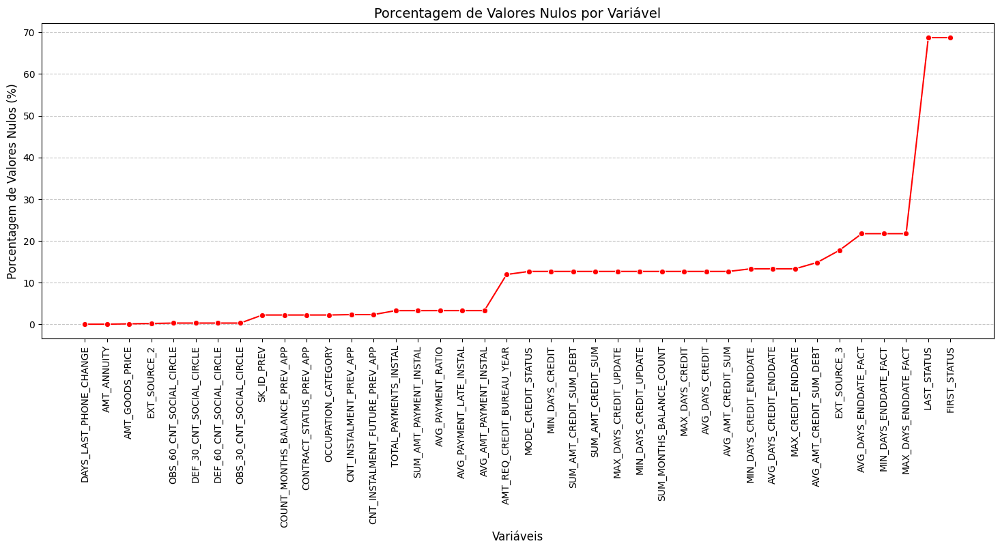

DAYS_LAST_PHONE_CHANGE             0.000122
AMT_ANNUITY                        0.004277
AMT_GOODS_PRICE                    0.090798
EXT_SOURCE_2                       0.170109
OBS_60_CNT_SOCIAL_CIRCLE           0.266895
DEF_30_CNT_SOCIAL_CIRCLE           0.266895
DEF_60_CNT_SOCIAL_CIRCLE           0.266895
OBS_30_CNT_SOCIAL_CIRCLE           0.266895
SK_ID_PREV                         2.205798
COUNT_MONTHS_BALANCE_PREV_APP      2.205798
CONTRACT_STATUS_PREV_APP           2.205798
OCCUPATION_CATEGORY                2.207631
CNT_INSTALMENT_PREV_APP            2.300384
CNT_INSTALMENT_FUTURE_PREV_APP     2.300384
TOTAL_PAYMENTS_INSTAL              3.256638
SUM_AMT_PAYMENT_INSTAL             3.256638
AVG_PAYMENT_RATIO                  3.263481
AVG_PAYMENT_LATE_INSTAL            3.263481
AVG_AMT_PAYMENT_INSTAL             3.263481
AMT_REQ_CREDIT_BUREAU_YEAR        11.915097
MODE_CREDIT_STATUS                12.652603
MIN_DAYS_CREDIT                   12.652603
SUM_AMT_CREDIT_SUM_DEBT         

In [274]:
plot_missing_values(final_df)

Removendo variáveis que ficaram com muitos missing values após os merges

In [275]:
final_df = final_df.drop(columns=['FIRST_STATUS', 'LAST_STATUS'])

## Divisão da base de dados 

In [276]:
df_model = final_df.copy()

In [277]:
df_model.dtypes

SK_ID_CURR                          int32
TARGET                               int8
NAME_CONTRACT_TYPE                 object
FLAG_OWN_CAR                       object
FLAG_OWN_REALTY                    object
CNT_CHILDREN                         int8
AMT_INCOME_TOTAL                  float32
AMT_CREDIT                        float32
AMT_ANNUITY                       float32
AMT_GOODS_PRICE                   float32
DAYS_EMPLOYED                       int32
DAYS_ID_PUBLISH                     int16
CNT_FAM_MEMBERS                   float32
REGION_RATING_CLIENT_W_CITY          int8
REG_CITY_NOT_WORK_CITY               int8
LIVE_CITY_NOT_WORK_CITY              int8
EXT_SOURCE_2                      float32
EXT_SOURCE_3                      float32
OBS_30_CNT_SOCIAL_CIRCLE          float32
DEF_30_CNT_SOCIAL_CIRCLE          float32
OBS_60_CNT_SOCIAL_CIRCLE          float32
DEF_60_CNT_SOCIAL_CIRCLE          float32
DAYS_LAST_PHONE_CHANGE            float32
AMT_REQ_CREDIT_BUREAU_YEAR        

In [278]:
X = df_model.drop(columns=['TARGET', 'SK_ID_PREV'])
y = df_model['TARGET']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [279]:
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)

X_train: (572808, 54)
X_test: (245490, 54)
y_train: (572808,)
y_test: (245490,)


In [280]:
X_train.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_EMPLOYED,...,MODE_CREDIT_STATUS,COUNT_MONTHS_BALANCE_PREV_APP,CNT_INSTALMENT_PREV_APP,CNT_INSTALMENT_FUTURE_PREV_APP,CONTRACT_STATUS_PREV_APP,TOTAL_PAYMENTS_INSTAL,SUM_AMT_PAYMENT_INSTAL,AVG_AMT_PAYMENT_INSTAL,AVG_PAYMENT_LATE_INSTAL,AVG_PAYMENT_RATIO
455853,298900,Cash loans,N,Y,0,112500.0,674842.5,43258.5,576000.0,-11337,...,Closed,14.0,12.0,0.0,Completed,12.0,363549.562500,30295.796875,-6.0,1.000000
471162,305457,Cash loans,Y,N,1,135000.0,414792.0,22630.5,315000.0,-2084,...,Active,13.0,12.0,0.0,Completed,14.0,64465.875000,4604.705566,27.0,0.857143
283892,223994,Cash loans,N,N,0,157500.0,1546020.0,42511.5,1350000.0,365243,...,Active,19.0,18.0,0.0,Completed,19.0,277909.375000,14626.809570,12.0,0.947368
265501,216140,Cash loans,N,Y,0,139500.0,1035000.0,41175.0,1035000.0,-3605,...,Closed,12.0,12.0,0.0,Completed,12.0,374614.562500,31217.880859,-8.0,1.000000
450266,296466,Cash loans,N,Y,0,270000.0,630000.0,32296.5,630000.0,-926,...,Active,11.0,24.0,0.0,Completed,9.0,52347.460938,5816.384766,0.0,1.000000


In [281]:
y_train.head()

455853    0
471162    0
283892    0
265501    0
450266    0
Name: TARGET, dtype: int8

# Pré-processamento

In [282]:
print(np.isinf(df_model.select_dtypes(include=[np.number])).sum())

SK_ID_CURR                         0
TARGET                             0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                        0
AMT_GOODS_PRICE                    0
DAYS_EMPLOYED                      0
DAYS_ID_PUBLISH                    0
CNT_FAM_MEMBERS                    0
REGION_RATING_CLIENT_W_CITY        0
REG_CITY_NOT_WORK_CITY             0
LIVE_CITY_NOT_WORK_CITY            0
EXT_SOURCE_2                       0
EXT_SOURCE_3                       0
OBS_30_CNT_SOCIAL_CIRCLE           0
DEF_30_CNT_SOCIAL_CIRCLE           0
OBS_60_CNT_SOCIAL_CIRCLE           0
DEF_60_CNT_SOCIAL_CIRCLE           0
DAYS_LAST_PHONE_CHANGE             0
AMT_REQ_CREDIT_BUREAU_YEAR         0
SUM_AMT_CREDIT_SUM                 0
AVG_AMT_CREDIT_SUM                 0
SUM_AMT_CREDIT_SUM_DEBT            0
AVG_AMT_CREDIT_SUM_DEBT            0
AVG_DAYS_CREDIT                    0
MIN_DAYS_CREDIT                    0
M

Substituindo valores infinitos por NaN pois gera erro no Pipeline

In [293]:
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

## Pipeline

In [287]:
#Variáveis numéricas e categóricas
num_features = df_model.select_dtypes(include=['number']).columns
num_features = num_features.drop(['TARGET', 'SK_ID_PREV'])
cat_features = df_model.select_dtypes(exclude=['number']).columns

In [288]:
#Transformer de variáveis numéricas
num_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

In [289]:
#Transformer de variáveis categóricas
cat_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

In [290]:
#Combinação dos pré-processadores
preprocessor = ColumnTransformer(
    transformers = [
        ('num', num_transformer, num_features),
        ('cat', cat_transformer, cat_features)
    ]
)

In [291]:
#Pipeline final
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])

In [294]:
#fit_transform e X_train e transform em X_test, de forma a evitar data leakage
X_train_transformed = pipeline.fit_transform(X_train)
X_test_transformed = pipeline.transform(X_test)

In [296]:
print("X_train_transformed:", X_train_transformed.shape)
print("X_test_transformed:", X_test_transformed.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)

X_train_transformed: (572808, 86)
X_test_transformed: (245490, 86)
y_train: (572808,)
y_test: (245490,)


In [298]:
X_train_transformed

array([[ 0.19996473, -0.57355068, -0.3094196 , ...,  0.        ,
         0.        ,  1.        ],
       [ 0.2637752 ,  0.80550175, -0.18834001, ...,  0.        ,
         0.        ,  1.        ],
       [-0.52899468, -0.57355068, -0.06726042, ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [-1.17526422, -0.57355068,  0.17489877, ...,  0.        ,
         0.        ,  1.        ],
       [ 1.09847879,  0.80550175,  0.17489877, ...,  0.        ,
         0.        ,  1.        ],
       [-1.21706168, -0.57355068, -0.18834001, ...,  0.        ,
         0.        ,  1.        ]])

## Novo dataframe transformado

Quando usamos One-Hot Encoding, as variáveis categóricas são convertidas em variáveis binárias (dummy variables), então é necessário "reconstruir" o dataframe

In [306]:
#nomes das variáveis numéricas
num_features_names = num_features
num_features_names

Index(['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT_W_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'SUM_AMT_CREDIT_SUM', 'AVG_AMT_CREDIT_SUM', 'SUM_AMT_CREDIT_SUM_DEBT',
       'AVG_AMT_CREDIT_SUM_DEBT', 'AVG_DAYS_CREDIT', 'MIN_DAYS_CREDIT',
       'MAX_DAYS_CREDIT', 'AVG_DAYS_CREDIT_ENDDATE', 'MIN_DAYS_CREDIT_ENDDATE',
       'MAX_CREDIT_ENDDATE', 'AVG_DAYS_ENDDATE_FACT', 'MIN_DAYS_ENDDATE_FACT',
       'MAX_DAYS_ENDDATE_FACT', 'MIN_DAYS_CREDIT_UPDATE',
       'MAX_DAYS_CREDIT_UPDATE', 'SUM_MONTHS_BALANCE_COUNT',
       'COUNT_MONTHS_BALANCE_PREV_APP', 'CNT_INSTALMENT_PREV_APP',
       'CNT_INSTALM

In [ ]:
#nomes das variáveis categóricas pós one-hot encoding
preprocessor = pipeline.named_steps['preprocessor']
preprocessor

In [313]:
#pré-processamento que utilizamos para variáveis categóricas
cat_transformer = preprocessor.named_transformers_['cat']
cat_feature_names = cat_transformer.named_steps['encoder'].get_feature_names_out(cat_features)
cat_feature_names

array(['NAME_CONTRACT_TYPE_Cash loans',
       'NAME_CONTRACT_TYPE_Revolving loans', 'FLAG_OWN_CAR_N',
       'FLAG_OWN_CAR_Y', 'FLAG_OWN_REALTY_N', 'FLAG_OWN_REALTY_Y',
       'ORGANIZATION_CATEGORY_Business Entity',
       'ORGANIZATION_CATEGORY_Education', 'ORGANIZATION_CATEGORY_Finance',
       'ORGANIZATION_CATEGORY_Healthcare',
       'ORGANIZATION_CATEGORY_Industry', 'ORGANIZATION_CATEGORY_Other',
       'ORGANIZATION_CATEGORY_Public Sector',
       'ORGANIZATION_CATEGORY_Self-employed',
       'ORGANIZATION_CATEGORY_Service Industry',
       'ORGANIZATION_CATEGORY_Trade', 'ORGANIZATION_CATEGORY_Transport',
       'ORGANIZATION_CATEGORY_Unknown', 'OCCUPATION_CATEGORY_',
       'OCCUPATION_CATEGORY_Core Staff',
       'OCCUPATION_CATEGORY_Customer Service',
       'OCCUPATION_CATEGORY_Laborer', 'OCCUPATION_CATEGORY_Manager',
       'OCCUPATION_CATEGORY_Technical Service',
       'OCCUPATION_CATEGORY_Transport Service',
       'OCCUPATION_CATEGORY_None', 'INCOME_SOURCE_Pension',
 

In [324]:
def rename_transformed_cat_feats(features):
    renamed_features = []
    
    for feat in features:
        renamed_feat = feat.replace(' ', '_')
        renamed_features.append(renamed_feat)

    return renamed_features
    
cat_feature_names = rename_transformed_cat_feats(cat_feature_names)

In [326]:
transformed_columns = np.concatenate([num_features_names, cat_feature_names])

In [327]:
transformed_columns

array(['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_EMPLOYED',
       'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT_W_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'SUM_AMT_CREDIT_SUM', 'AVG_AMT_CREDIT_SUM',
       'SUM_AMT_CREDIT_SUM_DEBT', 'AVG_AMT_CREDIT_SUM_DEBT',
       'AVG_DAYS_CREDIT', 'MIN_DAYS_CREDIT', 'MAX_DAYS_CREDIT',
       'AVG_DAYS_CREDIT_ENDDATE', 'MIN_DAYS_CREDIT_ENDDATE',
       'MAX_CREDIT_ENDDATE', 'AVG_DAYS_ENDDATE_FACT',
       'MIN_DAYS_ENDDATE_FACT', 'MAX_DAYS_ENDDATE_FACT',
       'MIN_DAYS_CREDIT_UPDATE', 'MAX_DAYS_CREDIT_UPDATE',
       'SUM_MONTHS_BALANCE_COUNT', 'COUNT_MONTHS_BALANCE_PREV_APP',
       'CNT_INSTALMENT_PREV_APP'

In [331]:
type(X_train_transformed)

numpy.ndarray

In [334]:
from scipy.sparse import issparse
issparse(X_train_transformed)

False

O X_train já é uma matriz densa, formato adequado para criar o dataframe

In [335]:
X_train_transformed_df = pd.DataFrame(X_train_transformed, columns=transformed_columns)

In [336]:
X_train_transformed_df.head()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_EMPLOYED,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,...,FAMILY_STATUS_Married,FAMILY_STATUS_Separated,FAMILY_STATUS_Single_/_not_married,FAMILY_STATUS_Widow,MODE_CREDIT_STATUS_Active,MODE_CREDIT_STATUS_Closed,MODE_CREDIT_STATUS_Other,CONTRACT_STATUS_PREV_APP_Active,CONTRACT_STATUS_PREV_APP_Canceled,CONTRACT_STATUS_PREV_APP_Completed
0,0.199965,-0.573551,-0.309420,0.190154,1.133249,0.100661,-0.555249,1.052983,-0.180363,-0.076929,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,0.263775,0.805502,-0.188340,-0.462074,-0.310984,-0.612507,-0.491983,-0.600140,0.920896,-0.076929,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,-0.528995,-0.573551,-0.067260,2.375136,1.080949,2.215575,2.019560,-1.673673,-0.180363,-2.125624,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,-0.605427,-0.573551,-0.164124,1.093457,0.987376,1.354854,-0.502383,0.007997,-0.180363,-0.076929,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4,0.176278,-0.573551,0.538138,0.077685,0.365764,0.248213,-0.484065,1.278046,-0.180363,-0.076929,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
